# **Homework 1**

### **Partial Dependence Plot (PDP)**

In [ ]:
import shap

In [ ]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

from itertools import chain, combinations, product
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset

device = "cpu" #"cuda" if torch.cuda.is_available() else "cpu"

seed = 0
torch.manual_seed(seed)
np.random.seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
with open("/content/drive/MyDrive/AIMS_XAI_Inga/data/LoanApprovalPrediction.csv", "r") as file:
    data_frame = pd.read_csv(file)
# Remove all rows with nan values
data_frame = data_frame.dropna()

In [ ]:
print(len(data_frame.columns))

13


In [ ]:
categorical_feature_names= ["Gender", "Married", "Education", "Self_Employed", "Property_Area", "Credit_History", "Dependents"]
continuous_feature_names= ["ApplicantIncome", "CoapplicantIncome", "LoanAmount", "Loan_Amount_Term"]
drop_column = "Loan_ID" # Not included as the value is unique for each row
label_column = "Loan_Status"

In [ ]:
categories_per_feature = [
    sorted(data_frame[col].unique().tolist()) for col in categorical_feature_names]
ohencoder = OneHotEncoder(categories=categories_per_feature)
scaler = StandardScaler()
labelencoder = LabelEncoder()

In [ ]:
categories_per_feature

[['Female', 'Male'],
 ['No', 'Yes'],
 ['Graduate', 'Not Graduate'],
 ['No', 'Yes'],
 ['Rural', 'Semiurban', 'Urban'],
 [0.0, 1.0],
 [0.0, 1.0, 2.0, 3.0]]

In [ ]:
def preprocess_data(df: pd.DataFrame, continuous_feature_names: list[str], categorical_feature_names: list[str], label_column=str) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Parameters:
        df (pd.DataFrame): the data in pandas dataframe format
        continuous_feature_names (list[str]): list of the feature names where the feature is continuous
        categorical_feature_names (list[str]): list of the feature names where the feature is categorical
        label_column (str): name of the label
    Returns:
        tuple[pd.DataFrame, pd.Dataframe]: preprocessed feature values and preprocessed labels
    """
    # Fit data, using a scaler for continuous data, oheencoder for categorical data and a labelencoder for the target values (label)
    continuous_features = scaler.transform(df[continuous_feature_names])
    categorical_features = ohencoder.transform(df[categorical_feature_names]).toarray()
    labels = labelencoder.transform(df[label_column])

    # Convert to tensors and using the available device
    continuous_features = torch.tensor(continuous_features, dtype=torch.float32, device=device)
    categorical_features = torch.tensor(categorical_features, dtype=torch.float32, device=device)
    labels = torch.tensor(labels, dtype=torch.float32, device=device)
    preprocessed_features = torch.hstack((continuous_features, categorical_features))

    return preprocessed_features, labels

In [ ]:
df = data_frame.copy(deep=True) # we will use the raw data later and do not want to modify in place
scaler.fit(df[continuous_feature_names])
ohencoder.fit(df[categorical_feature_names])
labelencoder.fit(df[label_column])
preprocessed_data, labels = preprocess_data(df, continuous_feature_names, categorical_feature_names, label_column)

X_train, X_test, y_train, y_test = train_test_split(preprocessed_data, labels, random_state=42, test_size=0.2)
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32)

**Create and train model**

In [ ]:
class Network(nn.Module):
    def __init__(self, input_dim: int):
        super().__init__()
        self.f1 = nn.Linear(input_dim, 64)
        self.f2 = nn.Linear(64, 1)

    def forward(self, x: torch.Tensor):
        x = F.relu(self.f1(x))
        x = self.f2(x)
        return x

In [ ]:
def train_one_epoch(train_loader, model):
    model.train()
    for X, y in train_loader:
        optimizer.zero_grad()
        outputs = model(X).squeeze(-1)
        loss = loss_fn(outputs, y)
        loss.backward()
        optimizer.step()

    model.eval()
    with torch.no_grad():
        outputs = model(X_test).squeeze(-1)
        loss = loss_fn(outputs, y_test)
        preds = torch.sigmoid(outputs)
        accuracy = sum((preds > 0.5) == y_test)/len(y_test)
    return loss, accuracy

In [ ]:
input_dim = len(X_train[0])
model = Network(input_dim).to(device)
loss_fn = nn.BCEWithLogitsLoss()
optimizer = optim.SGD(model.parameters(), lr=0.03)

In [ ]:
for _ in range(100):
    loss, accuracy = train_one_epoch(train_loader, model)
print("Loss:", loss.item(), "\nAccuracy:", accuracy.item())

Loss: 0.37547656893730164 
Accuracy: 0.8613861203193665


**Partial dependence plots**

We want to marginalize over all other features $\boldsymbol{x}_C$ so the function show the relationship between features (or feature) in set $S$:
$$
\hat{f}_S(\boldsymbol{x}_S) = \frac{1}{n}\sum^n_{i=1} \hat{f}(\boldsymbol{x}_S, \boldsymbol{x}_C^{(i)})
$$

First let us consider one categorical feature

In [ ]:
def create_modified_df(df: pd.DataFrame, feature: str, values: list) -> [dict[str, pd.DataFrame]]:
    """
    Parameters:
        df (pd.DataFrame): data
        feature (str): name of the feature that should be modified
        values (list): the possible values of the feature
    Returns:
        dict[str, pd.DataFrame]: set of dataframes where the the rows of the feature are set to the same value.
    """
    dfs = {}
    for value in values:
        df.loc[:, feature] = value
        dfs[value] = df.copy(deep=True)
    return dfs

In [ ]:
feature_name = "Married"
categories = set(df[feature_name].values.flatten())
mod_dfs = create_modified_df(data_frame.copy(deep=True), feature_name, categories)

print("Original number of data points:", df.shape[0])
print(f"Possible values for the feature {feature_name}: {categories}")
print("Number of dataframes for upsampled data:", len(mod_dfs))
print("Total number of data points:", [sum(len(mod_dfs[_key]) for _key in mod_dfs.keys())][0])

Original number of data points: 505
Possible values for the feature Married: {'Yes', 'No'}
Number of dataframes for upsampled data: 2
Total number of data points: 1010


In [ ]:
def get_marginalized_probability(df:pd.DataFrame, continuous_feature_names:list,
                                 categorical_feature_names:list, label_column:str)->float:
    """
    Parameters:
        df (pd.DataFrame): data
        continuous_feature_names (list): names of continuous feaures
        categorical_feature_names (list): names of categorical features
        label_column (str): header of the target column
    Returns:
        float: the mean sigmoid prediction for the dataframe.
    """
    preprocessed_data, labels = preprocess_data(df, continuous_feature_names, categorical_feature_names, label_column)

    outputs = model(preprocessed_data).squeeze(-1)
    preds = torch.sigmoid(outputs)
    return float(preds.mean().item())

In [ ]:
probabilities= {}
for category in categories:
    df = mod_dfs[category].copy(deep=True)
    probability = get_marginalized_probability(df, continuous_feature_names, categorical_feature_names, label_column)
    probabilities[category] = probability

In [ ]:
print(f"Marginalised probabilities per value of feature {feature_name}:")
print(probabilities)

Marginalised probabilities per value of feature Married:
{'Yes': 0.7166070938110352, 'No': 0.6497240662574768}


**Plot the results**

In [ ]:
y = probabilities.values()
x = probabilities.keys()

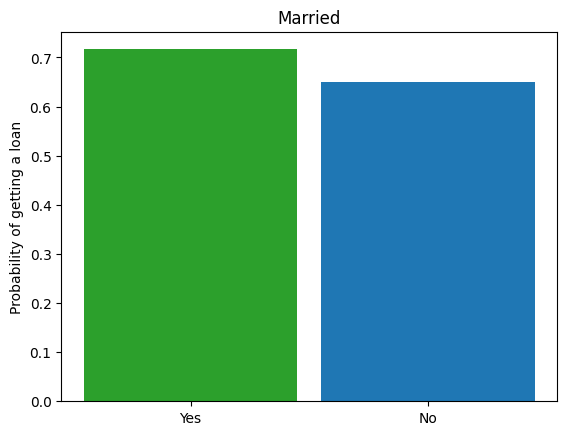

In [ ]:
fig, ax = plt.subplots()
#ax.bar(x, y, width=0.9, linewidth=0.7, color=["tab:blue", "tab:green", "tab:orange"]) # property area
ax.bar(x, y, width=0.9, linewidth=0.7, color=["tab:green", "tab:blue"]) # married
plt.title(feature_name)
plt.ylabel("Probability of getting a loan")
plt.show()

**Categorical features**

In [ ]:
plot_data = []
for feature_name in categorical_feature_names:
    df = data_frame.copy(deep=True)
    categories = set(df[feature_name].values.flatten())
    mod_dfs = create_modified_df(df, feature_name, categories)

    probabilities = {}
    for category in categories:
        probability = get_marginalized_probability(mod_dfs[category], continuous_feature_names, categorical_feature_names, label_column)
        probabilities[category] = probability

    y = probabilities.values()
    x = probabilities.keys()
    plot_data.append((feature_name, x,y))

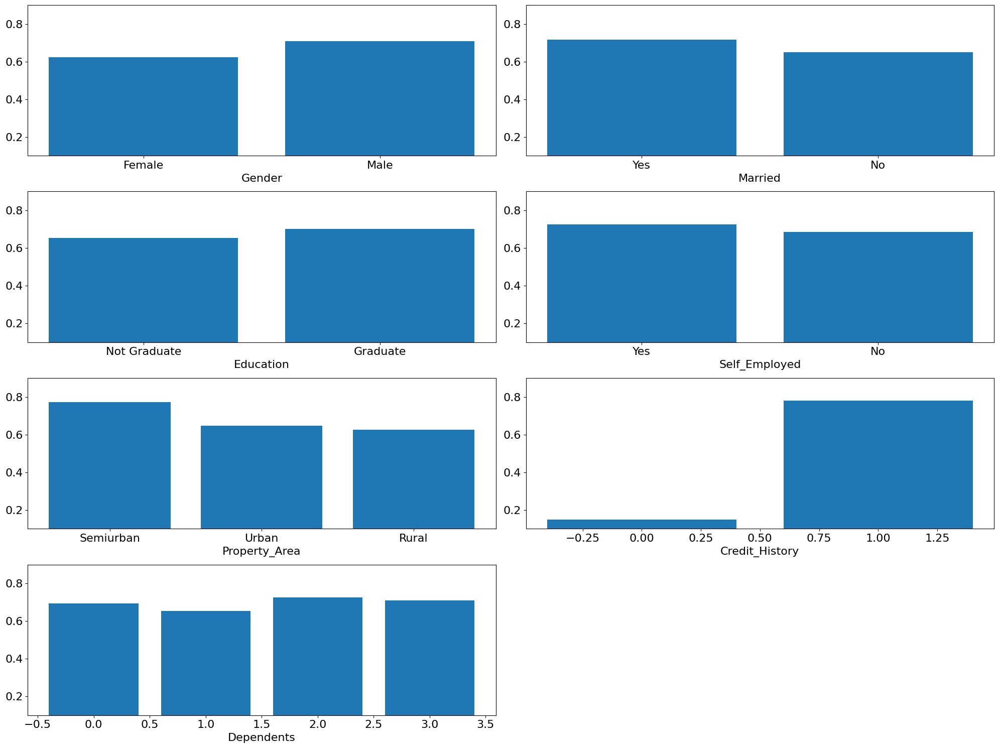

In [ ]:
data = plot_data.copy()  # Just to be safe

ncols = 2
N = len(data)
nrows = math.ceil(N / ncols)

fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20, 15))

# Ensure axs is 2D
if nrows == 1 and ncols == 1:
    axs = [[axs]]
elif nrows == 1:
    axs = [axs]
elif ncols == 1:
    axs = [[ax] for ax in axs]

# Plot each feature as a bar chart
for i, (feature, x, y) in enumerate(data):
    r, c = divmod(i, ncols)
    ax = axs[r][c]
    ax.bar(x, y)
    ax.tick_params(axis='both', labelsize=16)
    ax.set_xlabel(feature, fontsize=16)
    ax.set_ylim(0.1, 0.9)  # Optional: adjust as needed


# Hide unused subplots
for j in range(N, nrows * ncols):
    r, c = divmod(j, ncols)
    axs[r][c].axis("off")

fig.tight_layout()
plt.show()


**Continuous features**

In [ ]:
#feature = "LoanAmount"
feature = "CoapplicantIncome"

In [ ]:
plot_data = dict()
n = 10
def get_plot_with_range(start = 0.005, end = 0.995):
    for feature_name in continuous_feature_names:
        df = data_frame.copy(deep=True)
        lower_bound = np.quantile(df[feature_name], start)
        upper_bound = np.quantile(df[feature_name], end)
        values = np.linspace(lower_bound, upper_bound, n, dtype=int)
        #values = np.linspace(df[feature_name].min(), df[feature_name].max(), n, dtype=int)
        mod_dfs = create_modified_df(df, feature_name, values)

        probabilities = []
        for value in values:
            probability = get_marginalized_probability(mod_dfs[value].copy(deep=True),
                                                      continuous_feature_names, categorical_feature_names, label_column)
            probabilities.append(probability)

        plot_data[feature_name] = (values, probabilities)
    return plot_data

In [ ]:
plot_data = get_plot_with_range()

In [ ]:
print(f"Interval values for feature {feature}: {plot_data[feature][0]}")
print(f"Corresponding marginalized probabilities: {plot_data[feature][1]}")

Interval values for feature CoapplicantIncome: [    0  1719  3439  5158  6878  8597 10317 12036 13756 15476]
Corresponding marginalized probabilities: [0.6812028288841248, 0.7036442160606384, 0.7146379947662354, 0.7116810083389282, 0.69781494140625, 0.676649272441864, 0.6501657962799072, 0.6198651790618896, 0.5867627263069153, 0.5515697598457336]


### **Homework 1-1**
Calculate PDP values for the feature CoapplicantIncome, and see if you can make the curve change
trend just by changing the included range.

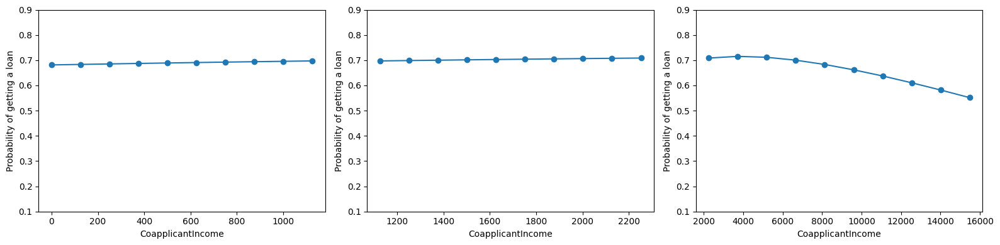

In [ ]:
values_limit = [0.05, 0.5, 0.75, 0.995]
plt.figure(figsize=(16,4))
for i in range(len(values_limit)-1):
    start = values_limit[i]
    end = values_limit[i+1]
    plot_data = get_plot_with_range(start, end)
    x, y = plot_data[feature]
    plt.subplot(1,3,i+1)
    plt.plot(x,y)
    plt.scatter(x, y)
    plt.ylim([0.1, 0.9])
    plt.xlabel(feature)
    plt.ylabel("Probability of getting a loan")
plt.tight_layout()
plt.show()

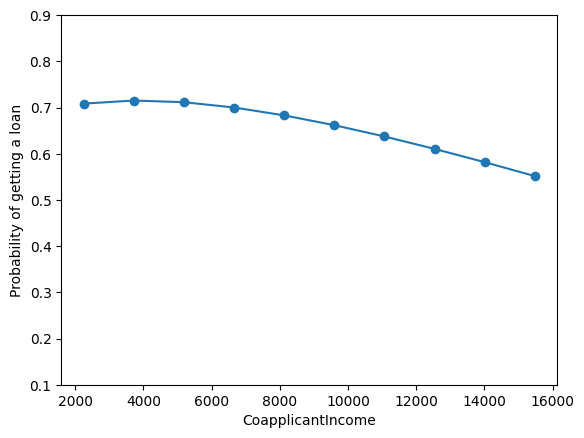

In [ ]:
x, y = plot_data[feature]
plt.plot(x, y)
plt.scatter(x, y)
plt.ylim([0.1, 0.9])
plt.xlabel(feature)
plt.ylabel("Probability of getting a loan")
plt.show()

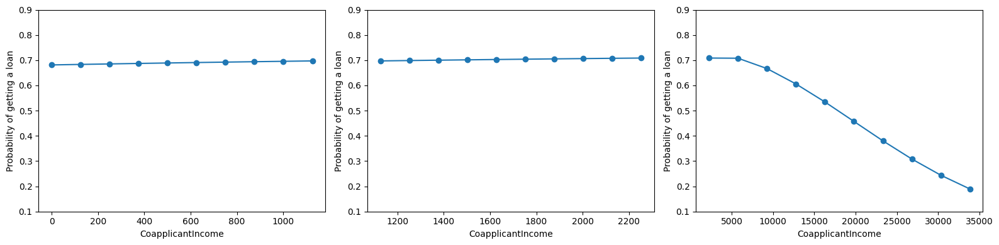

In [ ]:
values_limit = [0, 0.5, 0.75, 1]
plt.figure(figsize=(16,4))
for i in range(len(values_limit)-1):
    start = values_limit[i]
    end = values_limit[i+1]
    plot_data = get_plot_with_range(start, end)
    x, y = plot_data[feature]
    plt.subplot(1,3,i+1)
    plt.plot(x,y)
    plt.scatter(x, y)
    plt.ylim([0.1, 0.9])
    plt.xlabel(feature)
    plt.ylabel("Probability of getting a loan")
plt.tight_layout()
plt.show()

In [ ]:
plot_data = get_plot_with_range(0, 1)

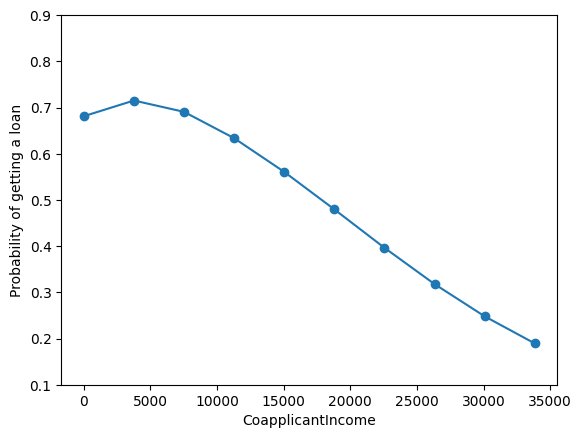

In [ ]:
x, y = plot_data[feature]
plt.plot(x, y)
plt.scatter(x, y)
plt.ylim([0.1, 0.9])
plt.xlabel(feature)
plt.ylabel("Probability of getting a loan")
plt.show()

We can observe that, for the intervals [0, 1200], [1200, 2200],, 2000], the curves are flat, indicating a monotonic evolution. However, for the interval [2200, 16000] for quantile  versus [2200, 35000] for linear, the direction changes, and we can also say that the outliers, in this case the high values, alter any interpretation according to the PDP. This means that it is necessary to take outliers into account in the machine learning model and the XAI method.

In [ ]:
# Convert PyTorch tensors to numpy for SHAP
background_data = X_train.cpu().numpy()
explain_data = X_test.cpu().numpy()

# Define a prediction function for the PyTorch model
def predict_fn(data_input):
    data_tensor = torch.tensor(data_input, dtype=torch.float32).to(device)
    with torch.no_grad():
        outputs = model(data_tensor).squeeze(-1)
        preds = torch.sigmoid(outputs)
    return preds.cpu().numpy()


explainer = shap.KernelExplainer(predict_fn, background_data)
shap_values = explainer.shap_values(explain_data)

  0%|          | 0/101 [00:00<?, ?it/s]

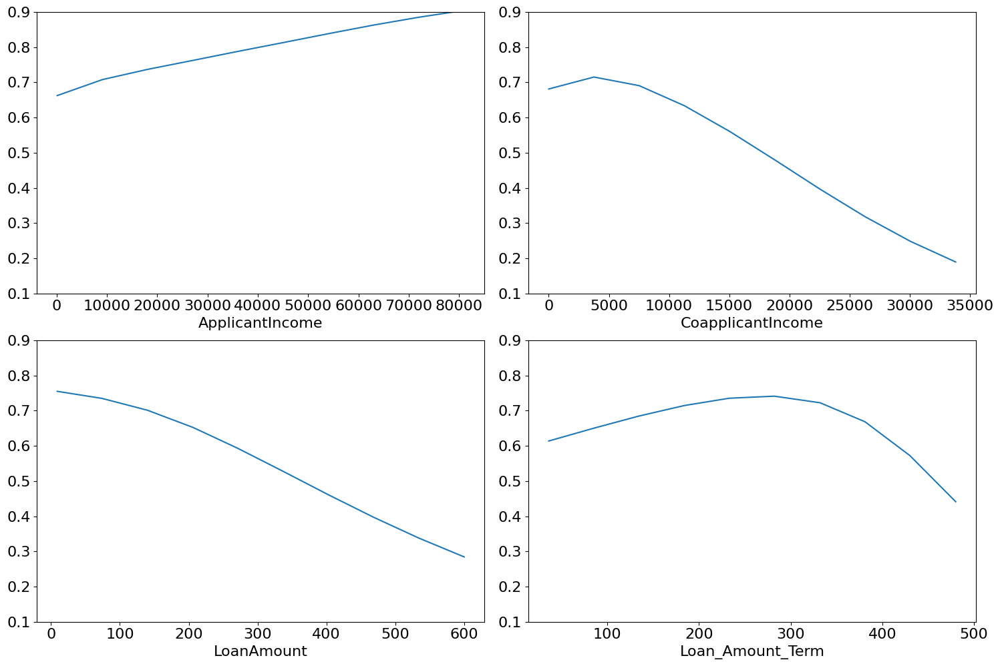

In [ ]:
data = plot_data.copy()
ncols=2
figsize=(15,10)
sharex=False
sharey=False

keys = list(data.keys())
N = len(keys)
nrows = math.ceil(N / ncols)

fig, axs = plt.subplots(nrows, ncols, figsize=figsize, sharex=sharex, sharey=sharey)
# Ensure axs is 2D for consistent indexing
if nrows == 1 and ncols == 1:
    axs = [[axs]]
elif nrows == 1:
    axs = [axs]
elif ncols == 1:
    axs = [[ax] for ax in axs]

# Plot each series
for i, key in enumerate(keys):
    r, c = divmod(i, ncols)
    ax = axs[r][c]
    x, y = data[key]
    ax.plot(x, y)
    ax.set_xlabel(str(key), fontsize=16)
    ax.tick_params(axis='both', labelsize=16)
    #ax.grid(True, alpha=0.3)
    ax.set_ylim(0.1, 0.9)

# Turn off any unused axes
for j in range(N, nrows * ncols):
    r, c = divmod(j, ncols)
    axs[r][c].axis("off")

# Optional common labels
#fig.supylabel("Probability of getting a loan")
fig.tight_layout()

**3D plot**

In [ ]:
def powerset(iterable, n: int = 2):
    "powerset([1,2,3]) --> () (1,) (2,) (3,) (1,2) (1,3) (2,3) (1,2,3)"
    s = list(iterable)
    comb = chain.from_iterable(combinations(s, r) for r in range(len(s)+1))
    return [list(x) for x in comb if len(x) == n]

In [ ]:
def create_modified_dfs_2d(df: pd.DataFrame, feature1: str, feature2: str, grid_points: np.ndarray) -> list[pd.DataFrame]:
    """
    For each (val1, val2) in grid_points, return a DataFrame where:
    - feature1 is set to val1
    - feature2 is set to val2
    Returns:
        List of DataFrames (one for each point in the grid).
    """
    modified_dfs = dict()
    for val1, val2 in grid_points:
        df_mod = df.copy(deep=True)
        df_mod[feature1] = val1
        df_mod[feature2] = val2
        modified_dfs[val1, val2] = df_mod
    return modified_dfs

In [ ]:
def get_marginalized_probability_2d(
    df: pd.DataFrame,
    feature1: str,
    value1,
    feature2: str,
    value2,
    values1: list,
    values2: list,
) -> float:
    """
    Calculates marginalized probability when both feature1=value1 and feature2=value2.
    """
    #? num_rows = df.shape[0]

    # Set both feature values across the entire dataset
    df = df.copy(deep=True)
    df[feature1] = value1
    df[feature2] = value2

    # Preprocess (custom function)
    preprocessed_data, labels = preprocess_data(
        df,
        continuous_feature_names=continuous_feature_names,
        categorical_feature_names=categorical_feature_names,
        label_column=label_column
    )

    # Model predictions
    outputs = model(preprocessed_data).squeeze(-1)
    preds = torch.sigmoid(outputs)

    return float(preds.mean().item())


In [ ]:
plot_data = dict()
n = 10

feature_names = ["ApplicantIncome", "LoanAmount"]
for (feature_name_1, feature_name_2) in powerset(feature_names, n=2):
    df = data_frame.copy(deep=True)
    # First we drop rows for the feature values that is nan
    df = df.dropna(subset=[feature_name_1, feature_name_2])

    is_cat_1 = feature_name_1 in categorical_feature_names
    is_cat_2 = feature_name_2 in categorical_feature_names

    if is_cat_1:
        values_1 = list(set(df[feature_name_1].values.flatten()))
    else:
        lb1 = np.quantile(df[feature_name_1], 0.005)
        ub1 = np.quantile(df[feature_name_1], 0.995)
        values_1 = np.linspace(lb1, ub1, n, dtype=int)

    if is_cat_2:
        values_2 = list(set(df[feature_name_2].values.flatten()))
    else:
        lb2 = np.quantile(df[feature_name_2], 0.005)
        ub2 = np.quantile(df[feature_name_2], 0.995)
        values_2 = np.linspace(lb2, ub2, n, dtype=int)

    grid_1, grid_2 = np.meshgrid(values_1, values_2)
    grid_points = list(product(grid_1.ravel(), grid_2.ravel()))

    mod_dfs = create_modified_dfs_2d(df, feature_name_1, feature_name_2, grid_points)

    probabilities = []
    vals1 = []
    vals2 = []
    for (val1, val2), mod_df in mod_dfs.items():
        probability = get_marginalized_probability_2d(mod_df.copy(deep=True), feature_name_1, val1, feature_name_2, val2, values_1, values_2)
        vals1.append(val1)
        vals2.append(val2)
        probabilities.append(probability)

    n, m = grid_1.shape
    vals1_grid = np.array(vals1).reshape(n, m)
    vals2_grid = np.array(vals2).reshape(n, m)
    probs_grid = np.array(probabilities).reshape(n, m)

    plot_data[(feature_name_1, feature_name_2)] = (vals1_grid, vals2_grid, probs_grid)

In [ ]:
def encode_categories(arr):
    """Returns encoded numeric array + label mapping"""
    unique_vals = sorted(set(arr.ravel()))
    label_map = {val: i for i, val in enumerate(unique_vals)}
    encoded = np.vectorize(label_map.get)(arr)
    return encoded, label_map

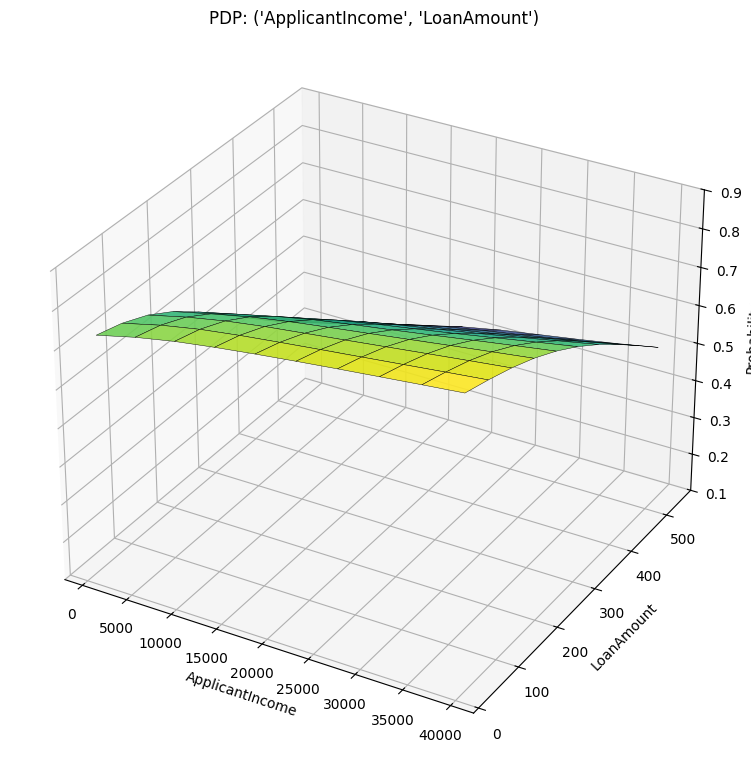

In [ ]:
data = plot_data.copy()
ncols = 2
figsize = (15, 10)

keys = list(data.keys())
N = len(keys)
nrows = math.ceil(N / ncols)

fig = plt.figure(figsize=figsize)

# Create a grid of 3D subplots manually
for i, key in enumerate(keys):
    row, col = divmod(i, ncols)
    ax = fig.add_subplot(nrows, ncols, i + 1, projection='3d')

    X, Y, Z = data[key]  # Each is (n, m)
    if X.dtype.kind in {"U"}:
        X, x_labels = encode_categories(X)
        ax.set_xticks(list(x_labels.values()))
        ax.set_xticklabels(list(x_labels.keys()))
    if Y.dtype.kind in {"U"}:
        Y, y_labels = encode_categories(Y)
        ax.set_yticks(list(y_labels.values()))
        ax.set_yticklabels(list(y_labels.keys()))
    ax.plot_surface(X, Y, Z, cmap='viridis', edgecolor='k', linewidth=0.3, alpha=0.9)

    # Axis labels
    ax.set_xlabel(str(key[0]))
    ax.set_ylabel(str(key[1]))

    ax.set_zlabel("Probability")
    ax.set_title(f"PDP: {key}")
    ax.set_zlim(0.1, 0.9)

# Optional: adjust layout
fig.tight_layout()
plt.show()

According to the Partial Dependence Plot (PDP), a high LoanAmount and a low ApplicantIncome moderately decrease the probability of getting the loan. This means that a high LoanAmount and a low ApplicantIncome affect the average prediction, assuming the other features are no effet on them.

## Accumulated Local Effects (ALE)

In [ ]:
import math
from typing import Callable, Literal

import pandas as pd, seaborn as sns, matplotlib.pyplot as plt, numpy as np

from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.neural_network import MLPRegressor

import torch
from torch.utils.data import DataLoader, TensorDataset

import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

device = "cuda" if torch.cuda.is_available() else "cpu"

seed = 0
torch.manual_seed(seed)
np.random.seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [ ]:
X, y = fetch_california_housing(as_frame=True, return_X_y=True)
train_df = pd.concat([X, y], axis=1).dropna() # Remove all rows with NaN values
X = train_df[X.columns]
y = train_df[y.name]
X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=42)
df = X.assign(MedHouseVal=y)
feature_names = X_train.columns.tolist()

In [ ]:
numerical_transformer = Pipeline([
])
preprocessor = ColumnTransformer(
    transformers = [
        ('scaler', StandardScaler(), feature_names)
    ],
    remainder = "drop"
)


pipe = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', MLPRegressor()),
])

In [ ]:
pipe.fit(X_train, y_train)
print("Accuracy:", pipe.score(X_test, y_test))

Accuracy: 0.7817180345916585


### Homework 1-2
 ALE estimation for a single feature
The explanations for the equations can be found in the [interpretable ml book](https://christophm.github.io/interpretable-ml-book/ale.html).

(1) First we estimate the uncentered effect:
$$
\hat{\tilde{f}}_{j,ALE}(\mathbf{x}) = \sum_{k=1}^{k_j(\mathbf{x})} \frac{1}{n_j(k)} \sum_{i: x_j^{(i)} \in N_j(k)} \left[\hat{f}(z_{k,j}, \mathbf{x}^{(i)}_{-j}) - \hat{f}(z_{k-1,j}, \mathbf{x}^{(i)}_{-j})\right]
$$
(2) Then we center the effect so that the mean effect is zero:
$$
\hat f_{j,\text{ALE}}(\mathbf{x}) = \hat{\tilde f}_{j,\text{ALE}}(\mathbf{x}) \;-\; \frac1n \sum_{i=1}^n \hat{\tilde f}_{j,\text{ALE}}\!\big(\mathbf{x}_j^{(i)}\big)
$$

In [ ]:

def ale(X: pd.DataFrame, model: Callable, feature: str, grid_size: int = 20, bin_method: Literal["quantile", "linear"] = "quantile"):
    """Compute the accumulated local effect of a numeric continuous feature.
    This function divides the feature in question into grid_size intervals (bins)
    and computes the difference in prediction between the first and last value
    of each interval and then centers the results.

    Arguments:
        X (pd.DataFrame): A pandas DataFrame to pass to the model for prediction.
        model: (Callable) Any python model with a predict method that accepts X as input.
        feature (str): String, the name of the column holding the feature being studied.
        grid_size (int): An integer indicating the number of intervals into which the feature range is divided.

    Return:
        A pandas DataFrame containing for each bin: the size of the sample in it
        and the accumulated centered effect of this bin.
    """

    # It is possible to use linspace, but this may be problematic for skewed distributions, thus we will use quantiles
    if bin_method == "quantile":
      bins = np.quantile(X[feature], np.linspace(0, 1, grid_size + 1))
    elif bin_method == "linear":
      bins = np.linspace(X[feature].min(), X[feature].max(), grid_size + 1)

    bins = np.unique(bins)
    # pd.cut assigns each value to a bin.
    feat_cut = pd.cut(X[feature], bins = bins, include_lowest = True)

    bin_codes = feat_cut.cat.codes # Index of interval for each data point
    bin_intervals = feat_cut.cat.categories # The actual intervals (left, right] in feat_cut

    # copy the dataframe twice
    X_left = X.copy()
    X_right = X.copy()
    # and replace the value of the feature with its left/right value from the corresponding bin
    X_left[feature] = [bin_intervals[code].left if code != -1 else np.nan  for code in bin_codes]
    X_right[feature] = [bin_intervals[code].right if code != -1 else np.nan  for code in bin_codes]

    y_left = model.predict(X_left)
    y_right = model.predict(X_right)

    # for each bin, calculate all delta=y_left-y_right and append them to a list
    # these are the Local Effects
    delta = [[] for _ in range(len(bins) - 1)]
    for i, code in enumerate(bin_codes):
      if code != 0 :
        delta_i = y_right[i]-y_left[i]
        delta[code].append(delta_i)

    delta_mean = [[np.mean(d) if len(d) > 0 else 0 for d in delta]]
    delta_cumsum = np.cumsum(delta_mean)
    delta_cumsum = np.concatenate([[0], delta_cumsum])
    delta_centered =  delta_cumsum - np.mean(delta_cumsum)

    return delta_centered, bin_intervals, delta_mean


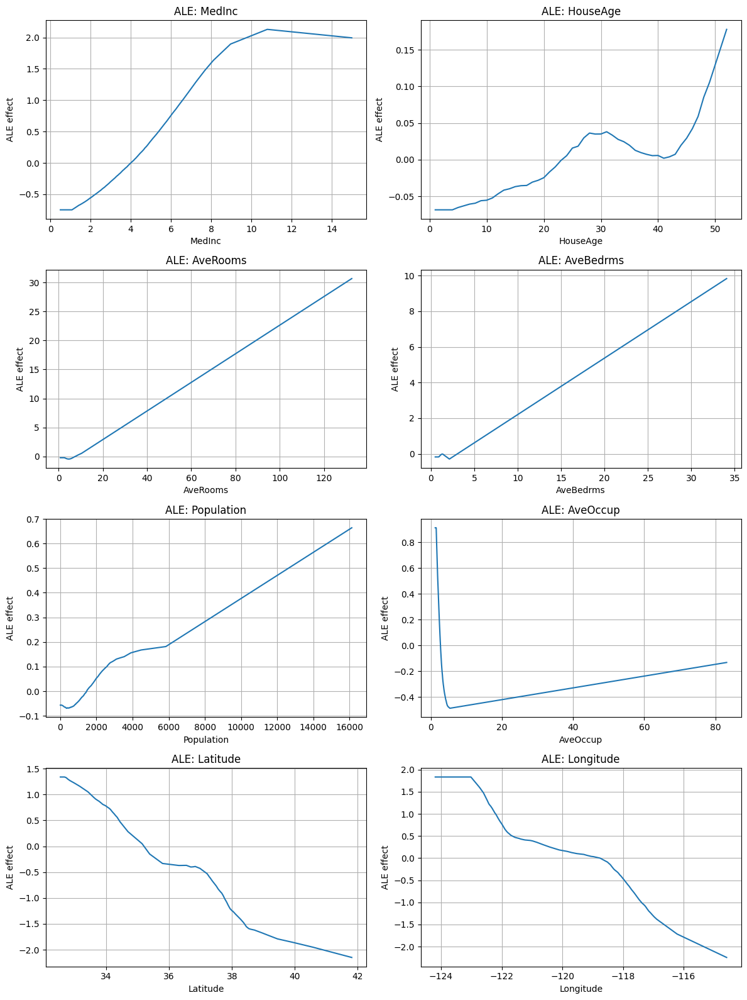

In [ ]:
n_cols = 2
n_rows = -(-len(feature_names) // n_cols)  # ceiling division
fig, axs = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows), squeeze=False)

for idx, feature_name in enumerate(feature_names):
    ax = axs[idx // n_cols][idx % n_cols]

    # Compute ALE effect
    ale_eff, bin_intervals, _ = ale(
        X=X_test,
        model=pipe,
        feature=feature_name,
        grid_size=100,
    )

    intervals = list(bin_intervals.left) + [bin_intervals.right[-1]] # For x axis

    ax.plot(intervals, ale_eff)
    ax.set_title(f"ALE: {feature_name}")
    ax.set_xlabel(feature_name)
    ax.set_ylabel("ALE effect")
    ax.grid(True)

# Turn off any unused axes
for i in range(len(feature_names), n_rows * n_cols):
    axs[i // n_cols][i % n_cols].axis("off")

plt.tight_layout()
plt.savefig("ale.png")
plt.show()

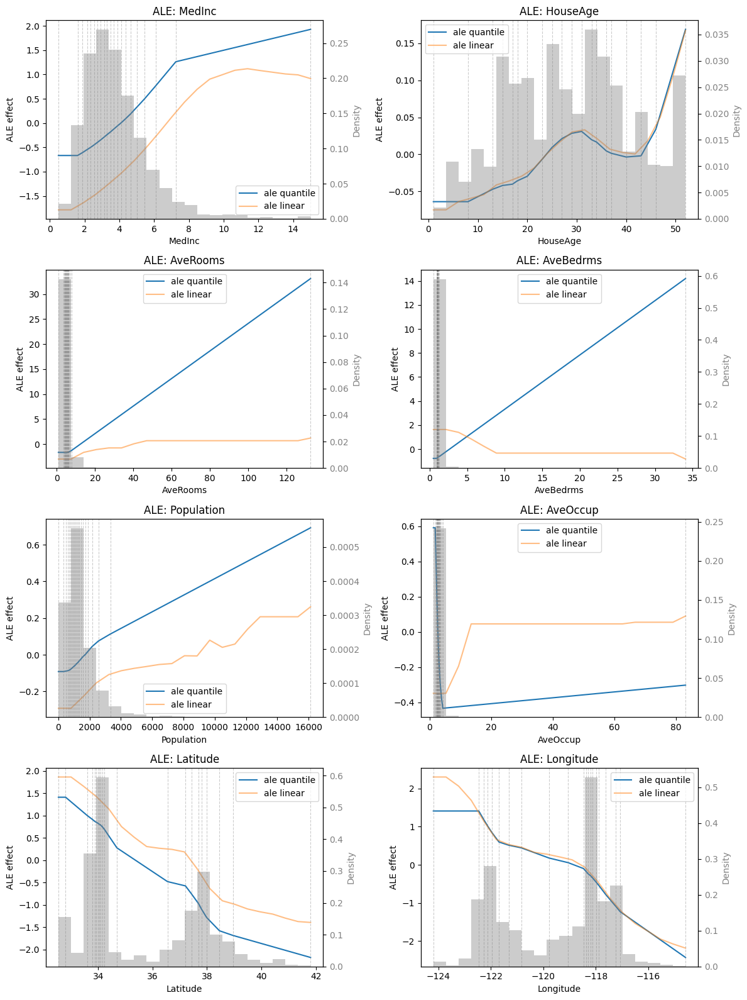

In [ ]:
n_cols = 2
n_rows = -(-len(feature_names) // n_cols)  # ceiling division
fig, axs = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows), squeeze=False)

ale_effects = {}
ale_effects_linear = {}

ale_intervals = {}
ale_intervals_linear = {}

for idx, feature in enumerate(feature_names):
    ax = axs[idx // n_cols][idx % n_cols]

    # Compute ALE effect
    ale_eff, bin_intervals, delta_mean = ale(
        X=X_test,
        model=pipe,
        feature=feature,
        grid_size=20,
    )
    ale_eff_linear, bin_intervals_linear, delta_mean_linear = ale(
        X=X_test,
        model=pipe,
        feature=feature,
        grid_size=20,
        bin_method="linear",
    )

    intervals = list(bin_intervals.left) + [bin_intervals.right[-1]] # For x axis labels
    intervals_linear = list(bin_intervals_linear.left) + [bin_intervals_linear.right[-1]] # For x axis labels

    ale_effects[feature] = ale_eff
    ale_effects_linear[feature] = ale_eff_linear
    ale_intervals[feature] = intervals
    ale_intervals_linear[feature] = intervals_linear

    interval_widths = list(bin_intervals.right - bin_intervals.left)

    # Manually plot ALE curve on the given axis
    ax.plot(intervals, ale_eff, label="ale quantile")
    ax.plot(intervals_linear, ale_eff_linear, alpha=0.5, label="ale linear")

    # play with this one
    #for xline in intervals_linear:
    for xline in intervals:
        ax.axvline(x=xline, color="gray", linestyle="--", alpha=0.4, linewidth=0.8)

    ax.set_title(f"ALE: {feature}")
    ax.set_xlabel(feature)
    ax.set_ylabel("ALE effect")
    ax.grid(False)
    ax.legend()

    ax_hist = ax.twinx()
    ax_hist.hist(
        X_test[feature],
        bins=20,
        color="gray",
        alpha=0.4,
        density=True,     # so it scales nicely with ALE curve
    )
    ax_hist.set_ylabel("Density", color="gray")
    ax_hist.tick_params(axis='y', labelcolor='gray')

# Turn off any unused axes
for i in range(len(feature_names), n_rows * n_cols):
    axs[i // n_cols][i % n_cols].axis("off")

plt.tight_layout()
plt.savefig("ale.png")
plt.show()

### Homework 1-3
Calculate the ALE effects for the california_housing data using both linspace and quantiles

In [ ]:
import shap

In [ ]:
background = X_train[:100]
def model_using_shap(X):
  return pipe.predict(X)
explainer = shap.Explainer(model_using_shap, background)
shap_values = explainer(X_test)

ExactExplainer explainer: 4129it [01:42, 35.56it/s]                          


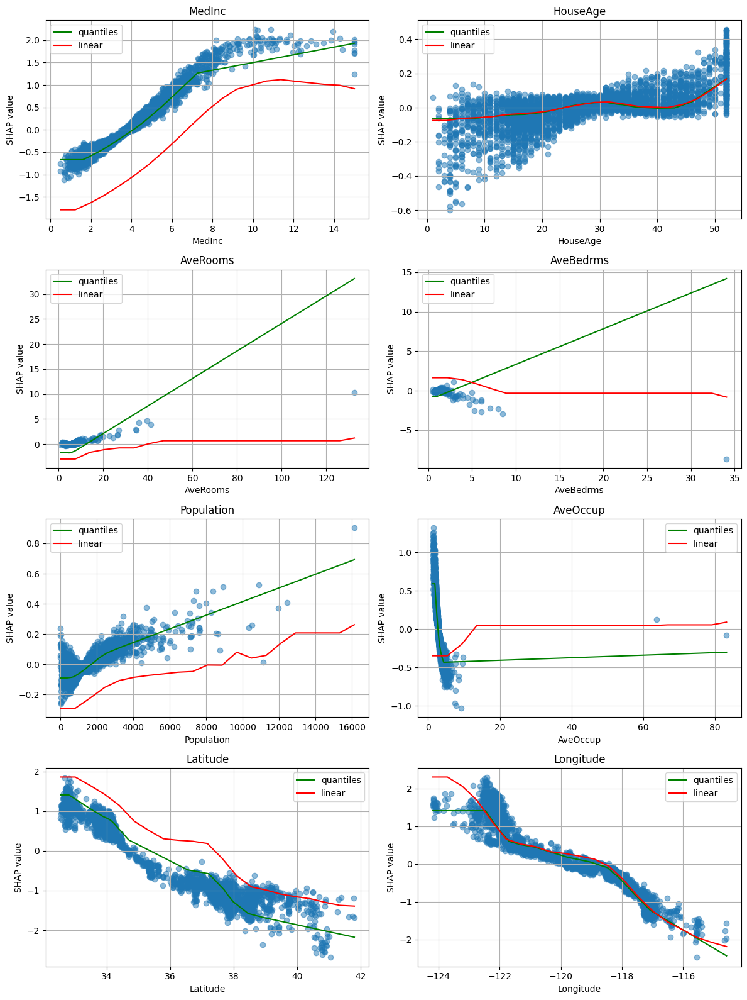

In [ ]:
n_cols = 2
n_rows = -(-len(feature_names) // n_cols)  # ceiling division
fig, axs = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 4 * n_rows), squeeze=False)

for idx, feature_name in enumerate(feature_names):
    ax = axs[idx // n_cols][idx % n_cols]

    feature_index = X_test.columns.get_loc(feature_name)
    shap_vals_feature = shap_values.values[:, feature_index]
    feature_values = X_test[feature_name].values

    ax.plot(ale_intervals[feature_name], ale_effects[feature_name], color="green", label="quantiles")
    ax.plot(ale_intervals_linear[feature_name], ale_effects_linear[feature_name], color="red", label="linear")
    ax.scatter(feature_values, shap_vals_feature, alpha=0.5)
    ax.set_xlabel(feature_name)
    ax.set_ylabel("SHAP value")
    ax.set_title(f"{feature_name}")
    ax.grid(True)
    ax.legend()

# Turn off any unused axes
for i in range(len(feature_names), n_rows * n_cols):
    axs[i // n_cols][i % n_cols].axis("off")

plt.tight_layout()
plt.show()

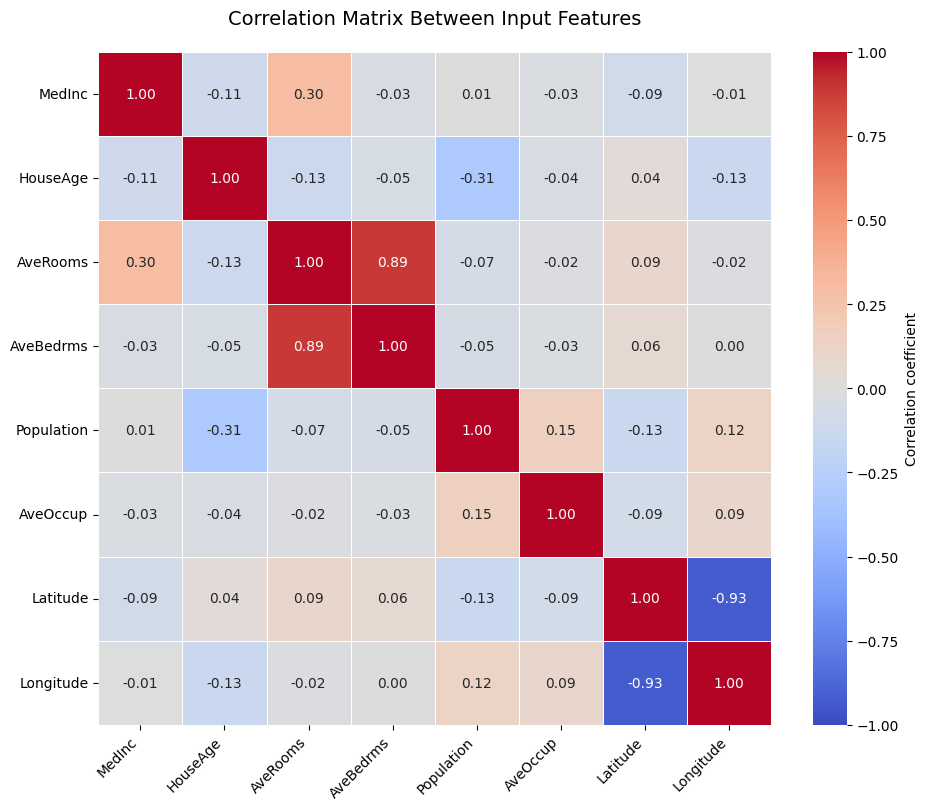

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


corr_matrix = X_test[feature_names].corr()

# Set up the figure size dynamically based on number of features
fig, ax = plt.subplots(figsize=(1.2 * len(feature_names), 1.0 * len(feature_names)))

# Create a heatmap with seaborn for better aesthetics
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    vmin=-1,
    vmax=1,
    linewidths=0.5,
    cbar_kws={"label": "Correlation coefficient"},
    square=True
)

ax.set_xticklabels(feature_names, rotation=45, ha="right")
ax.set_yticklabels(feature_names, rotation=0)

ax.set_title("Correlation Matrix Between Input Features", fontsize=14, pad=20)

plt.tight_layout()
plt.show()



#### Comment

The SHAP values agree more closely with the ALE plot computed using the quantile approach, while the linear approach is disturbed by outliers. We also observe that for AveRooms and AveBedrms, the ALE curves do not follow the SHAP value curves.

Looking at the correlation matrix, we can see that AveRooms and AveBedrms are highly correlated.

We can therefore conclude that, even though ALE is designed to handle feature correlation better than PDP, an extreme correlation between variables can still lead to differences between ALE and SHAP. This happens because SHAP tends to distribute (share) the contribution among correlated features, which explains why the SHAP and ALE explanations differ for these features.

# **Homework 2**

In [ ]:
import sage

from itertools import combinations
import numpy as np
import pandas as pd
import xgboost
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

**Data and model**

In [ ]:
df = sage.datasets.bike()
features = df.columns.tolist()[:-3]
target = df.columns.tolist()[-1]

In [ ]:
print("Features:", features)
print("Target:", target)

Features: ['Year', 'Month', 'Day', 'Hour', 'Season', 'Holiday', 'Workingday', 'Weather', 'Temp', 'Atemp', 'Humidity', 'Windspeed']
Target: Count


In [ ]:
# Split data, with total count serving as regression target
train, test = train_test_split(df, test_size=int(0.1 * len(df.values)), random_state=123)
train, val = train_test_split(train, test_size=int(0.1 * len(df.values)), random_state=123)

y_train = train[[target]]
y_bkg = val[[target]]
y_test = test[[target]]
x_train = train[features]
x_bkg = val[features]
x_test = test[features]

In [ ]:
model = xgboost.XGBRegressor()
model.fit(x_train, y_train);

In [ ]:
def mse(prediction, target):
    return np.mean((prediction - target)**2).item()

In [ ]:
# Calculate performance
base_mse = np.mean((np.mean(y_train) - y_test) ** 2)
full_mse = mse(model.predict(x_test), y_test.to_numpy().flatten())

print("Base rate MSE = {:.2f}".format(base_mse))
print("Model MSE = {:.2f}".format(full_mse))

Base rate MSE = 31591.23
Model MSE = 1878.77


# Homework 2-1: LOFO

In [ ]:
def lofo(model, features, train_df, y_train, test_df, y_test, loss):
    losses = {}
    lofos_ratio = {}
    lofos_diff = {}

    for i, feature in enumerate(features):
        _x_train = train_df[i:] + train_df[:i+1]
        _x_test = test_df[i:] + test_df[:i+1]

        _model = xgboost.XGBRegressor()
        _model.fit(_x_train, y_train)

        #get the loss for the subset and store it
        y_pred = _model.predict(_x_test)
        loss_subset = mean_squared_error(y_pred, y_test)
        losses[feature] = loss_subset
    for i, features in enumerate(features):
        # calculate the lofo as a ratio or difference (or both)
        lofos_ratio_subset = loss/ losses[features]
        lofos_ratio[features] = lofos_ratio_subset
        lofos_diff_subset = loss - losses[features]
        lofos_diff[features] = lofos_diff_subset
    return lofos_ratio, lofos_diff

In [ ]:
def lofo(model, features, train_df, y_train, test_df, y_test, loss):
    losses = {}
    lofos_ratio = {}
    lofos_diff = {}

    for _features in combinations(features, len(features)-1):
        _excluded = list(set(features) - set(_features))[0]
        _features = list(_features)
        _x_train = train_df[_features]
        _x_test = test_df[_features]

        _model = xgboost.XGBRegressor()
        _model.fit(_x_train, y_train);

        _loss = loss(_model.predict(_x_test), y_test.to_numpy().flatten())

        losses[_excluded] = _loss

    for _feature in features:
        lofos_ratio[_feature] = losses[_feature]/full_mse
        lofos_diff[_feature] = losses[_feature]-full_mse

    return lofos_ratio, lofos_diff

In [ ]:
lofos_ratio, lofos_diff = lofo(model, features, train, y_train, test, y_test, mse)

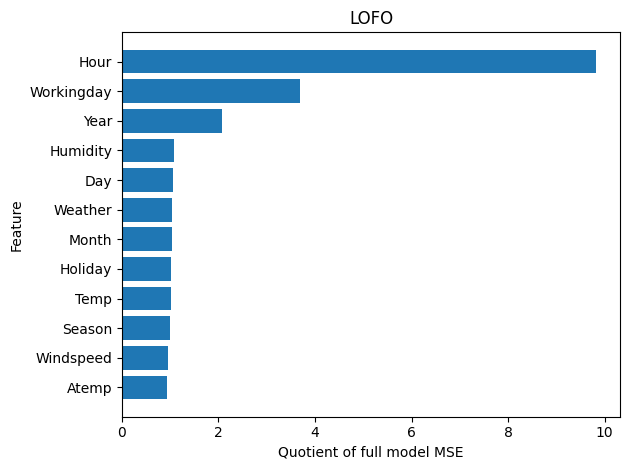

In [ ]:
# Create horizontal bar plot from sorted values
sorted_items = sorted(lofos_ratio.items(), key=lambda x: x[1])
keys, values = zip(*sorted_items)

plt.barh(range(len(keys)), values)
plt.yticks(range(len(keys)), keys)
plt.xlabel('Quotient of full model MSE')
plt.ylabel('Feature')
plt.title('LOFO')
plt.tight_layout()
plt.show()

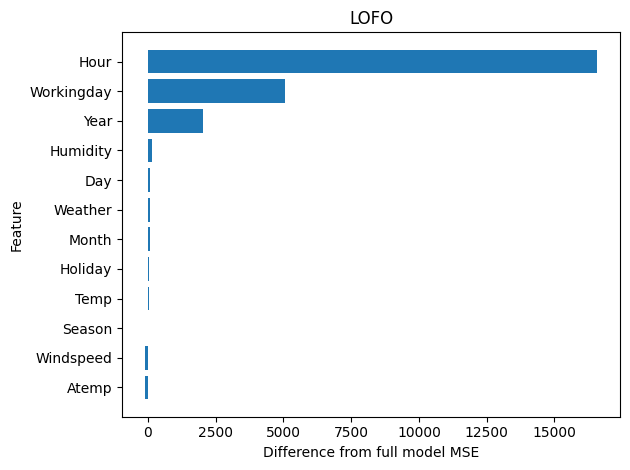

In [ ]:
# Create horizontal bar plot from sorted values
sorted_items = sorted(lofos_diff.items(), key=lambda x: x[1])
keys, values = zip(*sorted_items)

plt.barh(range(len(keys)), values)
plt.yticks(range(len(keys)), keys)
plt.xlabel('Difference from full model MSE')
plt.ylabel('Feature')
plt.title('LOFO')
plt.tight_layout()
plt.show()

In [ ]:
train_without = train.drop("Season", axis = 1)
test_without = test.drop("Season", axis = 1)

# Create a new features list that excludes 'Season'
features_without_season = [f for f in features if f != "Season"]

# Call lofo with the updated features list
lofos_ratio, lofos_diff = lofo(model, features_without_season, train_without, y_train, test_without, y_test, mse)

### LOFO without correlated features

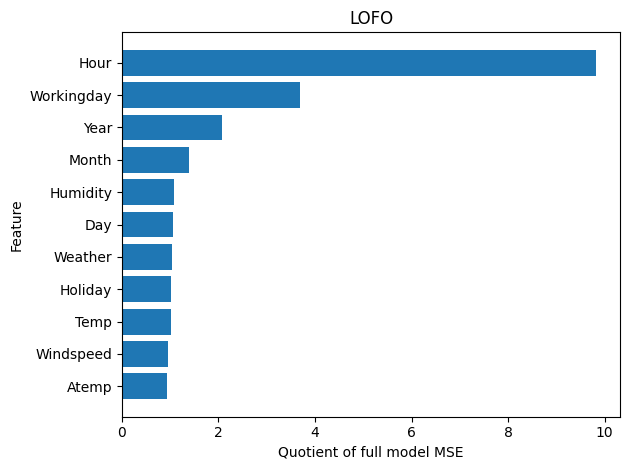

In [ ]:
# Create horizontal bar plot from sorted values
sorted_items = sorted(lofos_ratio.items(), key=lambda x: x[1])
keys, values = zip(*sorted_items)

plt.barh(range(len(keys)), values)
plt.yticks(range(len(keys)), keys)
plt.xlabel('Quotient of full model MSE')
plt.ylabel('Feature')
plt.title('LOFO')
plt.tight_layout()
plt.show()

In [ ]:
train_without = train.drop("Month", axis = 1)
test_without = test.drop("Month", axis = 1)

# Create a new features list that excludes 'Season'
features_without_month = [f for f in features if f != "Month"]

# Call lofo with the updated features list
lofos_ratio, lofos_diff = lofo(model, features_without_month, train_without, y_train, test_without, y_test, mse)

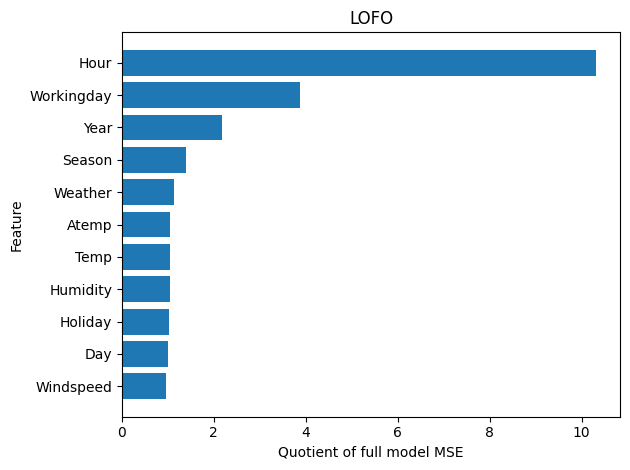

In [ ]:
# Create horizontal bar plot from sorted values
sorted_items = sorted(lofos_ratio.items(), key=lambda x: x[1])
keys, values = zip(*sorted_items)

plt.barh(range(len(keys)), values)
plt.yticks(range(len(keys)), keys)
plt.xlabel('Quotient of full model MSE')
plt.ylabel('Feature')
plt.title('LOFO')
plt.tight_layout()
plt.show()

#### Comment
This comment is about performance mpodel no predictionWe can say there the rank of Month become more important when we delete Season to use LOFO. The same thing for  Season  when we  delete Month. That mean because these features are correled , LOFO don't find the important of them when both ois present. But
the removing of one helps LOFO to get the really importance.

## Sage

In [ ]:
import sage #pip install sage-importance
import shap

from itertools import combinations
import numpy as np
import pandas as pd
import xgboost
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

In [ ]:
df = sage.datasets.bike()
features = df.columns.tolist()[:-3]
target = df.columns.tolist()[-1]

In [ ]:
print("Features:", features)
print("Target:", target)

Features: ['Year', 'Month', 'Day', 'Hour', 'Season', 'Holiday', 'Workingday', 'Weather', 'Temp', 'Atemp', 'Humidity', 'Windspeed']
Target: Count


In [ ]:
# Split data, with total count serving as regression target
train, test = train_test_split(df, test_size=int(0.1 * len(df.values)), random_state=123)
train, bkg = train_test_split(train, test_size=int(0.1 * len(df.values)), random_state=123)

y_train = train[[target]]
y_bkg = bkg[[target]]
y_test = test[[target]]
x_train = train[features]
x_bkg = bkg[features]
x_test = test[features]

In [ ]:


model = xgboost.XGBRegressor()
model.fit(x_train, y_train);



In [ ]:
X = x_bkg.to_numpy()          # (N, d)
Y = np.asarray(y_bkg).ravel() # (N,)

imputer = sage.MarginalImputer(model, X[:512])
estimator = sage.PermutationEstimator(imputer, "mse")
sage_values = estimator(X, Y)

  0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
print("Number of features:", len(features))
print("Number of SAGE values:", len(sage_values.values))
print(sage_values)

Number of features: 12
Number of SAGE values: 12
SAGE Explanation(
  (Mean): [ 2793.66  1338.83    42.55 19493.44     0.00    28.90  2745.85   320.10
  1753.44   717.21  1387.31   -65.45]
  (Std):  [143.89  89.87  28.28 477.96   0.00   9.00 133.48  45.41  83.73  44.89
  68.97  25.67]
)


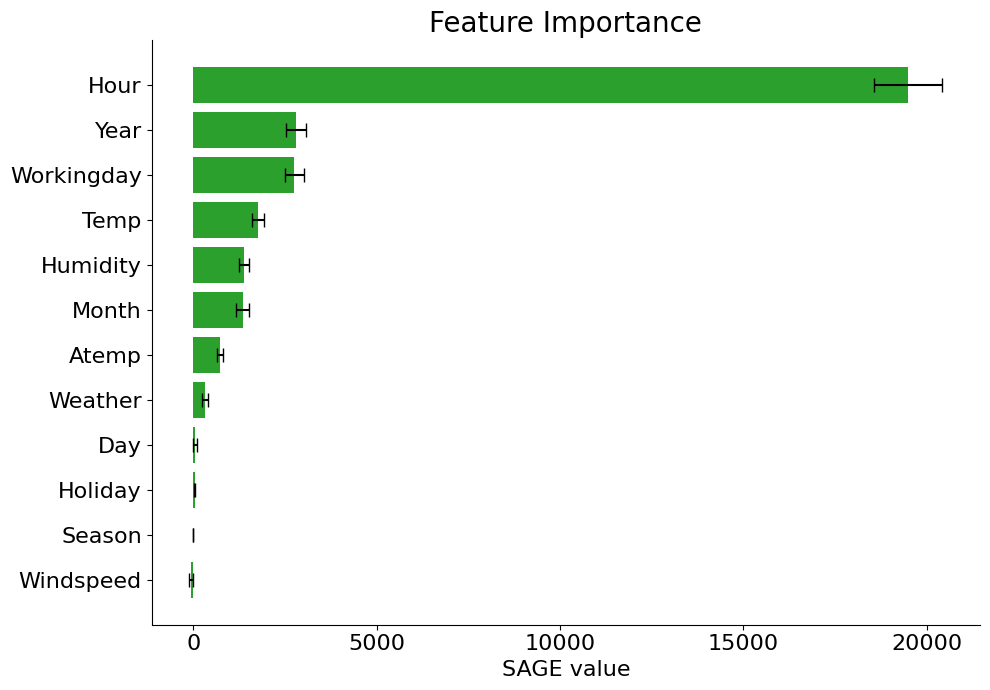

In [ ]:
# Plot results
sage_values.plot(features)

**Imputers and loss functions**

In [ ]:
imputer = sage.MarginalImputer(model, X)
imputer

/usr/local/lib/python3.12/dist-packages/sage/imputers.py:50: RuntimeWarning: using 1088 background samples may lead to slow runtime, consider using <= 1024
  warnings.warn('using {} background samples may lead to slow '


In [ ]:
imputer = sage.MarginalImputer(model, X[:512])
imputer

In [ ]:
X.shape

(1088, 12)

In [ ]:
estimator = sage.PermutationEstimator(imputer, "mse")
estimator.loss_fn

In [ ]:
sage_values = estimator(X, Y)

  0%|          | 0/1 [00:00<?, ?it/s]

### Comparison SAGE to SHAP

In [ ]:
explainer = shap.TreeExplainer(model, data = x_bkg)
shap_values = explainer.shap_values(x_test)

/tmp/ipython-input-1293072184.py:1: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, x_test, plot_type="violin")


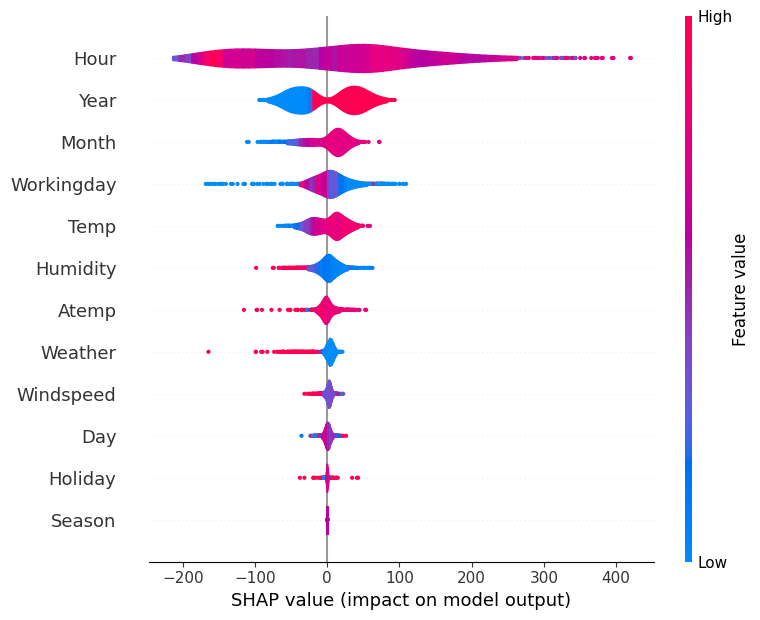

In [ ]:
shap.summary_plot(shap_values, x_test, plot_type="violin")

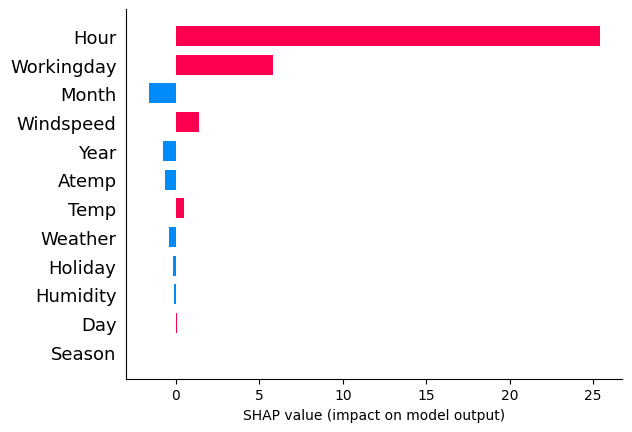

In [ ]:
shap_mean = np.mean(shap_values, axis=0)
shap.bar_plot(shap_mean, feature_names=features, max_display=12)

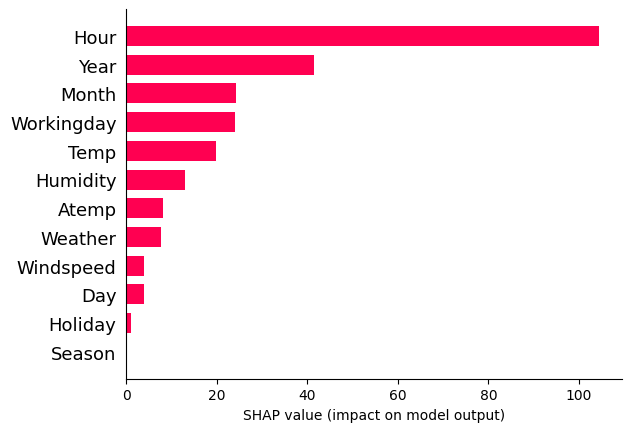

In [ ]:
shap_mean = np.mean(np.abs(shap_values), axis=0)
shap.bar_plot(shap_mean, feature_names=features, max_display=12)

SAGE and SHAP have almost the the same ranking. But when we do the men of shapes values that can hide the real rank by summing negatifs ans possitifs values.

### Comparison SAGE to LOFO

In [ ]:
full_mse = mse(model.predict(x_test), y_test.to_numpy().flatten())

def lofo(model, features, train_df, y_train, test_df, y_test, loss):
    losses = {}
    lofos_ratio = {}
    lofos_diff = {}

    for _features in combinations(features, len(features)-1):
        _excluded = list(set(features) - set(_features))[0]
        _features = list(_features)
        _x_train = train_df[_features]
        _x_test = test_df[_features]

        _model = xgboost.XGBRegressor()
        _model.fit(_x_train, y_train);

        _loss = loss(_model.predict(_x_test), y_test.to_numpy().flatten())

        losses[_excluded] = _loss

    for _feature in features:
        lofos_ratio[_feature] = losses[_feature]/full_mse
        lofos_diff[_feature] = losses[_feature]-full_mse

    return lofos_ratio, lofos_diff

def mse(prediction, target):
    return np.mean((prediction - target)**2).item()

In [ ]:
lofos_ratio, lofos_diff = lofo(model, features, train, y_train, test, y_test, mse)

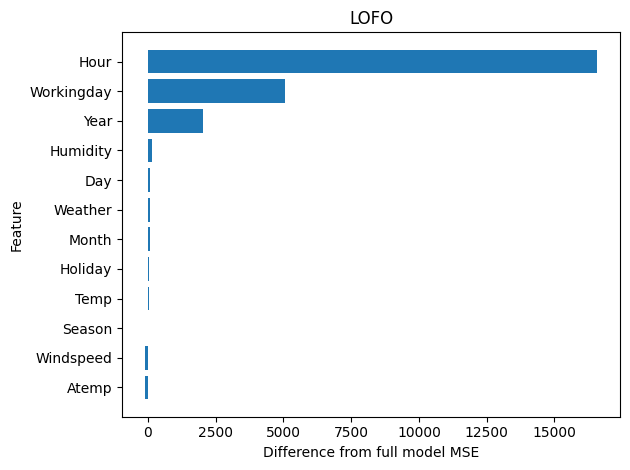

In [ ]:
# Create horizontal bar plot from sorted values
sorted_items = sorted(lofos_diff.items(), key=lambda x: x[1])
keys, values = zip(*sorted_items)

plt.barh(range(len(keys)), values)
plt.yticks(range(len(keys)), keys)
plt.xlabel('Difference from full model MSE')
plt.ylabel('Feature')
plt.title('LOFO')
plt.tight_layout()
plt.show()

### Comparison to SHAP and LOFO

In [ ]:
SHAP = shap_mean
SAGE = sage_values.values
LOFOS = [lofos_diff[_feature] for _feature in features]

In [ ]:
def normalize(x):
    x = np.array(x)
    return x / x.sum()

sage_norm = normalize(SAGE)
shap_norm = normalize(SHAP)
lofo_norm = normalize(LOFOS)

In [ ]:
keys = np.array(keys)
order = np.argsort(lofo_norm)
keys_sorted = keys[order]

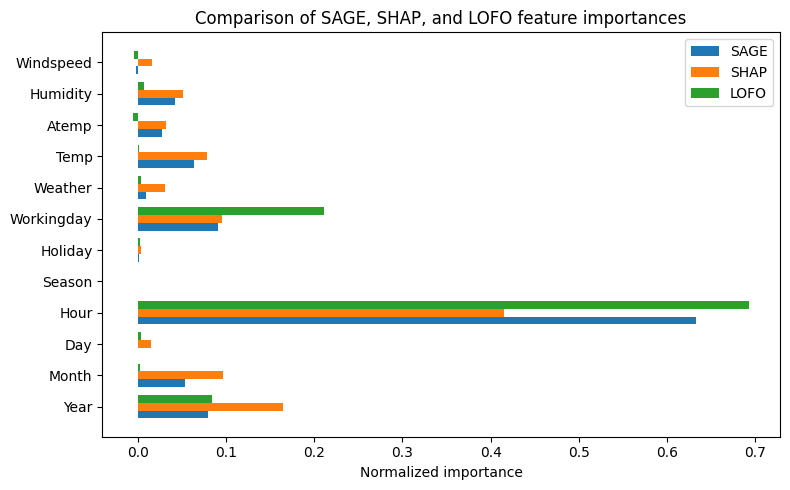

In [ ]:
# Plot grouped bars
x = np.arange(len(features))
width = 0.25

plt.figure(figsize=(8,5))
plt.barh(x - width, sage_norm, width, label='SAGE')
plt.barh(x, shap_norm, width, label='SHAP')
plt.barh(x + width, lofo_norm, width, label='LOFO')

plt.yticks(x, features)
plt.xlabel('Normalized importance')
plt.title('Comparison of SAGE, SHAP, and LOFO feature importances')
plt.legend()
plt.tight_layout()
plt.show()

# Homework 2-2
 Study correlation structure in the data and investigate a datapoint with SHAP

In [ ]:
feature_list = list(keys)
feature_list.reverse()

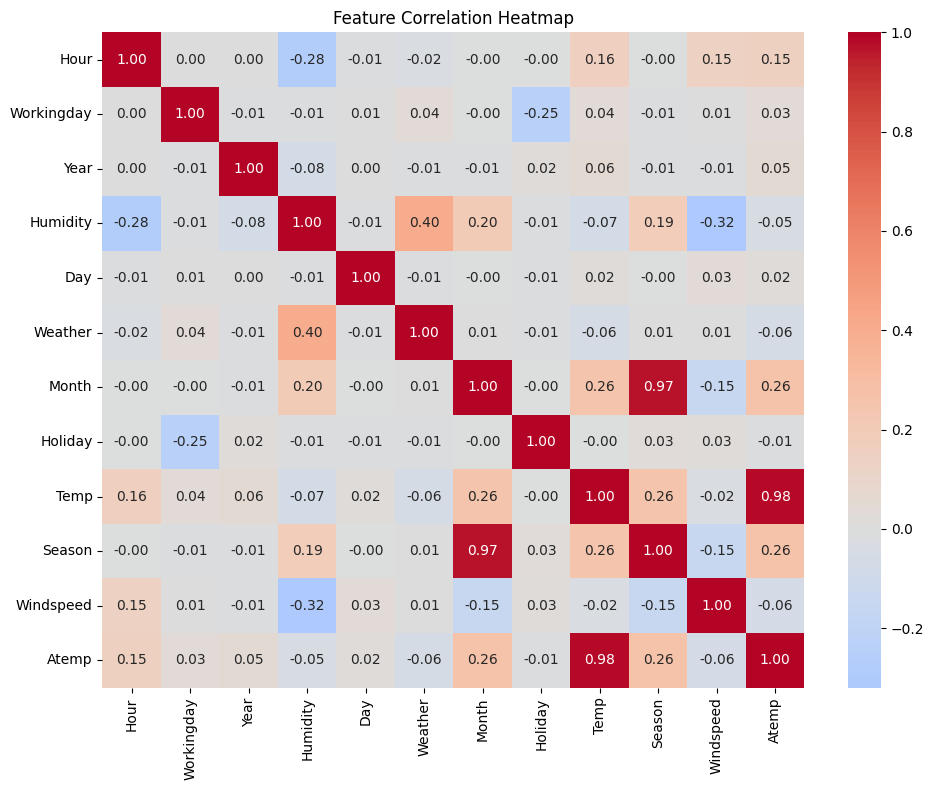

In [ ]:
# Compute correlation matrix
corr = train[feature_list].corr()

# Plot heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', center=0, fmt=".2f")

plt.title("Feature Correlation Heatmap")
plt.tight_layout()
plt.show()

We see that the feature "Month" correlates strongly with Season and Temperature.

Let's find a point for which the SHAP value of Month is high, and look at the SHAP explaination

Thus we can conclude the importance according to LOFO is almost rubbish because Season contain almost the same information than Month. So LOFO don't find any performance more for Month when Season is presente. But SHAP and SAGE even though are disturbed by correlation share all contribution to Month and Temperature. Same thing for Atemp and temp.

In [ ]:
interesting = "Month"
f_idx = features.index(interesting)

# shap_values shape: (n_samples, n_features)
abs_shap = np.abs(shap_values[:, f_idx])

# Get top indices and values
top_idx = np.argsort(abs_shap)[::-1][:10]
print("Top samples with high SHAP for", interesting, ":", top_idx)
print("SHAP values:", shap_values[top_idx, f_idx])

Top samples with high SHAP for Month : [ 438  350  450  632  739  691 1031  102  889  917]
SHAP values: [-111.01751961 -108.73147482  -96.36441475  -92.28717958  -92.14128562
  -90.68881544  -90.32328162  -88.71882324  -88.29298175  -87.7180561 ]


In [ ]:
shap.initjs()
index = top_idx[0].item()
shap.force_plot(explainer.expected_value, shap_values[index,:], x_test.iloc[index,:])

In [ ]:
shap.initjs()
index = top_idx[1].item()
shap.force_plot(explainer.expected_value, shap_values[index,:], x_test.iloc[index,:])

In [ ]:
shap.initjs()
index = top_idx[8].item()
shap.force_plot(explainer.expected_value, shap_values[index,:], x_test.iloc[index,:])

In [ ]:
shap.initjs()
index = top_idx[2].item()
shap.force_plot(explainer.expected_value, shap_values[index,:], x_test.iloc[index,:])

We can say for these cases SHAP ranks month high because it acts as a proxy for the same information captured by season and temperature. When features are highly correlated, SHAP importance is not unique, the model can attribute the shared effect to any one of them. In theses cases we can even say  because temp are Attemp often second or thrid  means SHAP share the contribution of month ,temperature, Atemps and Season reason why they are going the same idrection.

#### Comment

Study the correlation structure of the data. What can you say about the feature ‘Month’?
Find an instance where the SHAP value of ‘Month’ is high and display its SHAP values. What do you find?
Based on this, can you say something about why the SHAP, SAGE and LOFO values might disagree about
this feature?

# Homework 3

## Homework 3-1

## TCAV

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import sys
sys.path.append("/content/drive/MyDrive")
import numpy as np
import matplotlib.pyplot as plt

import torch
from torchvision.io import read_image
from torchvision import models, transforms
from torchvision.models import ResNet18_Weights
from sklearn.utils import shuffle
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from PIL import Image

from image_processing import select_concept_images, sample_images, get_resnet_dataloader
from utils import flatten, get_activations, get_grads

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)

cpu


In [ ]:
batch_size = 16
num_concept_images = 100
num_target_images = 20
target_class = "zebra"
positive_concept = "striped" #"bubbly"
negative_concept = "dotted"

In [ ]:
%cd /content/drive/MyDrive/data

!mkdir -p broden
%cd broden

!wget https://www.robots.ox.ac.uk/~vgg/data/dtd/download/dtd-r1.0.1.tar.gz
!tar -xzf dtd-r1.0.1.tar.gz

!mv dtd/images/* dtd/
!rmdir dtd/images

In [ ]:
%cd /content/drive/MyDrive/data/imagenet
!mkdir -p zebra
!mv volcano_zebra.jpg zebra/
!cd /content/drive/MyDrive/data/imagenet/zebra

!wget https://image-net.org/data/winter21_whole/n02391049.tar
!tar -xf n02391049.tar
!rm n02391049.tar


In [ ]:
!mv *.JPEG zebra/
!mv *.jpg zebra/ 2>/dev/null

In [ ]:
# @title
!huggingface-cli login

In [ ]:
# @title
from datasets import load_dataset

imagenet = load_dataset(
    "ILSVRC/imagenet-1k",
    split="train",
    streaming=True
)

# Zebra = label 340
zebra_images = []
for ex in imagenet:
    if ex["label"] == 340:
        zebra_images.append(ex["image"])
    if len(zebra_images) == 20:
        break

print(len(zebra_images))


In [ ]:
# @title
dtd = load_dataset(
    "cansa/Describable-Textures-Dataset-DTD",
    split="train",
    streaming=True
)

positive_concept_name = "striped"
negative_concept_name = "dotted"

# Get the ClassLabel features to map names to IDs
features = dtd.features
label_names = features["label"].names

positive_concept_id = label_names.index(positive_concept_name)
negative_concept_id = label_names.index(negative_concept_name)

p_concept_images = []
n_concept_images = []

for ex in dtd:
    if ex["label"] == positive_concept_id:
        p_concept_images.append(ex["image"])
    elif ex["label"] == negative_concept_id:
        n_concept_images.append(ex["image"])

    if len(p_concept_images) >= 50 and len(n_concept_images) >= 50:
        break

print("Striped:", len(p_concept_images))
print("Dotted:", len(n_concept_images))

In [ ]:
# @title
from datasets import load_dataset

imagenet = load_dataset(
    "ILSVRC/imagenet-1k",
    split="train",
    streaming=True
)

# Zebra = label 340
zebra_images = []
for ex in imagenet:
    if ex["label"] == 340:
        zebra_images.append(ex["image"])
    if len(zebra_images) == 20:
        break

print(len(zebra_images))

In [ ]:
# @title
import os
drive_base_path = "/content/drive/MyDrive/data/dtd/"
os.makedirs(drive_base_path, exist_ok=True)
for i, img in enumerate(n_concept_images):
    img.save(f"{drive_base_path}/striped_{i:03d}.jpg")

drive_base_path = "/content/drive/MyDrive/data/imagenet/zebra"
os.makedirs(drive_base_path, exist_ok=True)
for i, img in enumerate(zebra_images):
    img.save(f"{drive_base_path}/zebra_{i:03d}.jpg")

In [270]:
# @title
# Get the absolute path to concept and target images
base_dir = os.path.join(os.getcwd(), '')
concept_folder = os.path.join(base_dir, 'data', 'broden', 'dtd')
target_folder = os.path.join(base_dir, 'data', 'imagenet', target_class)

p_concept_paths = select_concept_images(folder_path=concept_folder, concept=positive_concept, n=num_concept_images)
n_concept_paths = select_concept_images(folder_path=concept_folder, concept=negative_concept, n=num_concept_images)

target_paths = sample_images(folder_path=target_folder, n=num_target_images)

In [ ]:
# Absolute paths to concept subfolders
positive_concept_folder = "/content/drive/MyDrive/data/broden/dtd/striped"
negative_concept_folder = "/content/drive/MyDrive/data/broden/dtd/dotted"

# Select concept images using the correct folder and prefix
p_concept_paths = select_concept_images(
    folder_path=positive_concept_folder,
    concept="striped",      # must match file prefix
    n=num_concept_images
)

n_concept_paths = select_concept_images(
    folder_path=negative_concept_folder,
    concept="dotted",       # must match file prefix
    n=num_concept_images
)

# Target images (for example, zebras)
target_folder = "/content/drive/MyDrive/data/imagenet/zebra"
target_paths = sample_images(folder_path=target_folder, n=num_target_images)

# Quick check
print("Positive concept images:", p_concept_paths[:5])
print("Negative concept images:", n_concept_paths[:5])
print("Target images:", target_paths[:5])


Positive concept images: ['/content/drive/MyDrive/data/broden/dtd/striped/striped_0064.jpg', '/content/drive/MyDrive/data/broden/dtd/striped/striped_0092.jpg', '/content/drive/MyDrive/data/broden/dtd/striped/striped_0088.jpg', '/content/drive/MyDrive/data/broden/dtd/striped/striped_0045.jpg', '/content/drive/MyDrive/data/broden/dtd/striped/striped_0122.jpg']
Negative concept images: ['/content/drive/MyDrive/data/broden/dtd/dotted/dotted_0152.jpg', '/content/drive/MyDrive/data/broden/dtd/dotted/dotted_0158.jpg', '/content/drive/MyDrive/data/broden/dtd/dotted/dotted_0168.jpg', '/content/drive/MyDrive/data/broden/dtd/dotted/dotted_0161.jpg', '/content/drive/MyDrive/data/broden/dtd/dotted/dotted_0114.jpg']
Target images: ['/content/drive/MyDrive/data/imagenet/zebra/n02391049_4058.JPEG', '/content/drive/MyDrive/data/imagenet/zebra/n02391049_155.JPEG', '/content/drive/MyDrive/data/imagenet/zebra/n02391049_272.JPEG', '/content/drive/MyDrive/data/imagenet/zebra/n02391049_2225.JPEG', '/content/

In [ ]:
resnet = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1).to(device)
resnet.eval();

In [ ]:
class_idx = ResNet18_Weights.IMAGENET1K_V1.meta["categories"].index(target_class)

In [ ]:
transform = transforms.Compose([transforms.ToTensor(), transforms.Resize((224, 224)),
                                transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])])

positive_loader = get_resnet_dataloader(p_concept_paths, transform, batch_size=batch_size)
negative_loader = get_resnet_dataloader(n_concept_paths, transform, batch_size=batch_size)
target_loader = get_resnet_dataloader(target_paths, transform, batch_size=batch_size)

**Interlude: Look at data and layer**

In [ ]:
def look_at(image):
    img = (image - image.min()) / (image.max() - image.min())
    plt.imshow(img.permute(1, 2, 0))
    plt.show()

torch.Size([3, 224, 224])


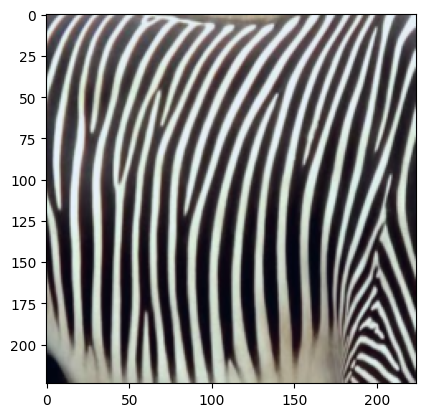

In [ ]:
pos_image = next(iter(positive_loader))[3]
print(pos_image.shape)
look_at(pos_image)

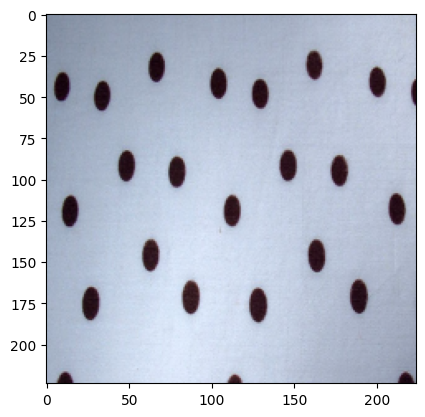

In [ ]:
neg_image = next(iter(negative_loader))[6]
look_at(neg_image)

In [ ]:
layer = resnet.layer4[0]
layer._modules

{'conv1': Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False),
 'bn1': BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 'relu': ReLU(inplace=True),
 'conv2': Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False),
 'bn2': BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
 'downsample': Sequential(
   (0): Conv2d(256, 512, kernel_size=(1, 1), stride=(2, 2), bias=False)
   (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
 )}

**Get activations manually**

In [ ]:
activations = {}
# keys = layer names (strings)
# values = activation tensors

def get_activation(name):
    # function factory for creating a hook function that captures the name of the layer it’s attached to.
    def hook(model, input, output):
        activations[name] = output.detach()
    return hook

layer_name = 'layer4'
handle = dict(resnet.named_modules())[layer_name].register_forward_hook(get_activation(layer_name))

_ = resnet(pos_image.unsqueeze(0).to(device))

handle.remove()

print(activations["layer4"].shape)

torch.Size([1, 512, 7, 7])


In [ ]:
acts = activations["layer4"]
acts.view(acts.size(0), -1).numpy().shape

(1, 25088)

**Make the CAV**

In [ ]:
def train_cav(positive_activations, negative_activations, seed=1337):

    X = np.concatenate([positive_activations, negative_activations], axis=0)
    y = np.concatenate([np.ones(len(positive_activations)), np.zeros(len(negative_activations))])

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, shuffle=True, random_state=seed)
    #X_train, y_train = shuffle(X, y, random_state=seed)
    classifier = LogisticRegression(random_state=seed, max_iter=1000)
    classifier.fit(X_train, y_train)

    accuracy = classifier.score(X_test, y_test)
    print("Probe accuracy:", accuracy)

    cav = classifier.coef_[0]
    unit_cav = cav / np.linalg.norm(cav)

    return unit_cav

In [ ]:
layer = resnet.layer4[0]

In [ ]:
positive_activations = flatten(get_activations(resnet, positive_loader, device, layer))
negative_activations = flatten(get_activations(resnet, negative_loader, device, layer))

In [ ]:
stripes_cav = train_cav(positive_activations, negative_activations)
#bubbly_cav = train_cav(positive_activations, negative_activations)

Probe accuracy: 1.0


In [ ]:
print(stripes_cav.shape)
print(stripes_cav)

(25088,)
[ 0.00046239 -0.01348    -0.00996508 ...  0.00212947  0.00433885
  0.01011351]


 ... and calculate TCAV scores

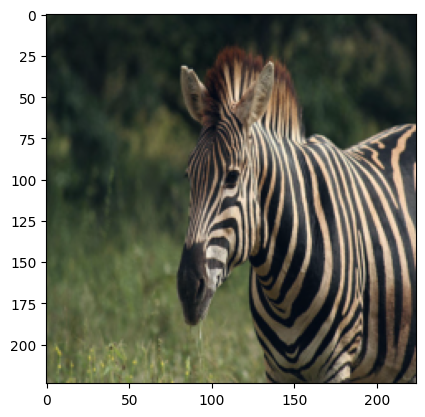

In [ ]:
image = next(iter(target_loader))[5]
look_at(image)

In [ ]:
def make_gradient_hook(grads):
    def bwd_hook(module, grad_input, grad_output):
        grad = grad_output[0]
        grads.append(grad.squeeze(0).detach().cpu())
    return bwd_hook

resnet.eval()
sample_input = image.unsqueeze(0).to(device)

grads = []
hook = layer.register_full_backward_hook(make_gradient_hook(grads))

resnet.zero_grad()
output = resnet(sample_input)
logits = output[0]

logit = logits[340]
logit.backward()
hook.remove()

print("Number of gradients from layer:", len(grads[0]))

Number of gradients from layer: 512


In [ ]:
def tcav(cav, grads):

    directional_derivatives = np.dot(grads, cav)
    positive_counts = np.sum(directional_derivatives > 0)
    tcav_score = positive_counts / directional_derivatives.shape[0]

    return tcav_score

In [ ]:
grads = flatten(get_grads(resnet, target_loader, device, layer, target_idx=340))
tcav_score = tcav(stripes_cav, grads)
#tcav_score = tcav(bubbly_cav, grads)
print(f"TCAV score: {tcav_score}")

TCAV score: 1.0


Loop through model to get a list of all layers

In [281]:
names, layers = [], []
for name, layer in resnet.named_children():
    names.append(name)
    layers.append(layer)
print("Number of layers:" , len(layers))

Number of layers: 10


In [282]:
names

['conv1',
 'bn1',
 'relu',
 'maxpool',
 'layer1',
 'layer2',
 'layer3',
 'layer4',
 'avgpool',
 'fc']

Get probe accuracies for each layer and plot

In [ ]:
accuracies = []
for _layer in layers:
    _positive_activations = flatten(get_activations(resnet, positive_loader, device, _layer))
    _negative_activations = flatten(get_activations(resnet, negative_loader, device, _layer))
    _, _accuracy = train_cav(_positive_activations, _negative_activations)
    accuracies.append(_accuracy)

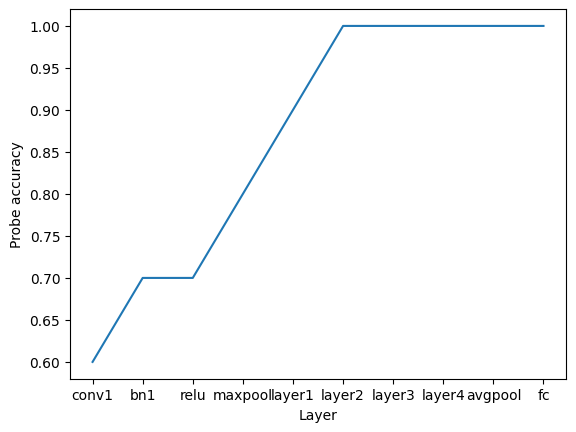

In [ ]:
colors = plt.cm.tab10(range(len(accuracies)))
plt.plot(range(len(accuracies)), accuracies)
plt.xticks(range(len(names)), names)
plt.xlabel('Layer')
plt.ylabel('Probe accuracy')
plt.show()

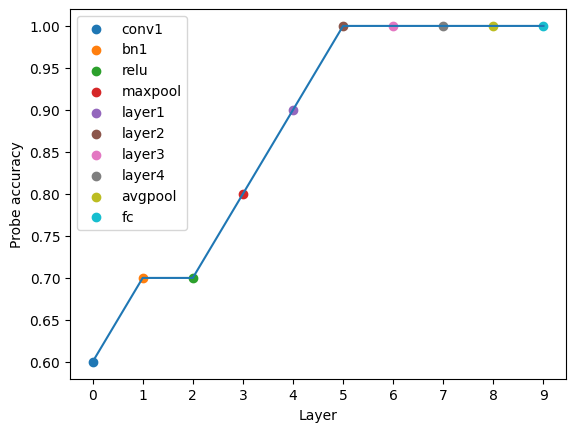

In [ ]:
colors = plt.cm.tab10(range(len(accuracies)))
for _i, _acc in enumerate(accuracies):
    plt.scatter(_i, _acc, color=colors[_i], label=names[_i])
plt.plot(range(len(accuracies)), accuracies)
plt.xticks(range(len(names)), range(len(names)))
plt.xlabel('Layer')
plt.ylabel('Probe accuracy')
plt.legend()
plt.show()

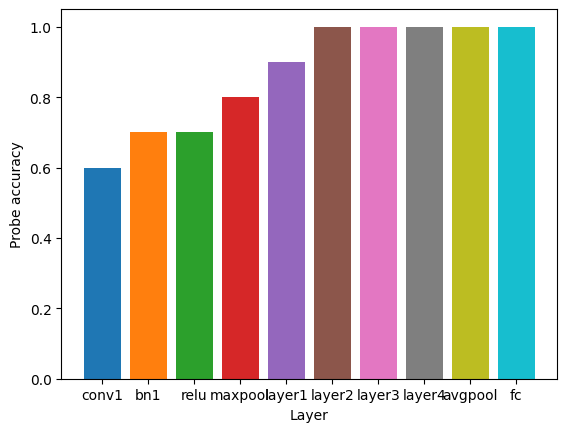

In [ ]:
colors = plt.cm.tab10(range(len(accuracies)))
plt.bar(range(len(accuracies)), accuracies, color=colors)
plt.xticks(range(len(names)), names)
plt.xlabel('Layer')
plt.ylabel('Probe accuracy')
plt.show()

We can also select the layers more carefully

In [ ]:
probe_layers = [resnet.conv1, resnet.layer1[0], resnet.layer2[0], resnet.layer3[0], resnet.layer4[0], resnet.fc]
probe_names = [names[0], names[4], names[5], names[6], names[7], names[9]]

In [ ]:
accuracies = []
for _layer in probe_layers:
    _positive_activations = flatten(get_activations(resnet, positive_loader, device, _layer))
    _negative_activations = flatten(get_activations(resnet, negative_loader, device, _layer))
    _, _accuracy = train_cav(_positive_activations, _negative_activations)
    accuracies.append(_accuracy)

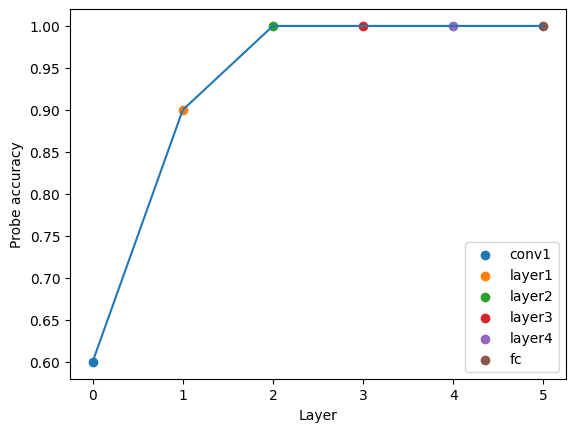

In [ ]:
colors = plt.cm.tab10(range(len(accuracies)))
for _i, _acc in enumerate(accuracies):
    plt.scatter(_i, _acc, color=colors[_i], label=probe_names[_i])
plt.plot(range(len(accuracies)), accuracies)
plt.xticks(range(len(probe_names)), range(len(probe_names)))
plt.xlabel('Layer')
plt.ylabel('Probe accuracy')
plt.legend()
plt.show()

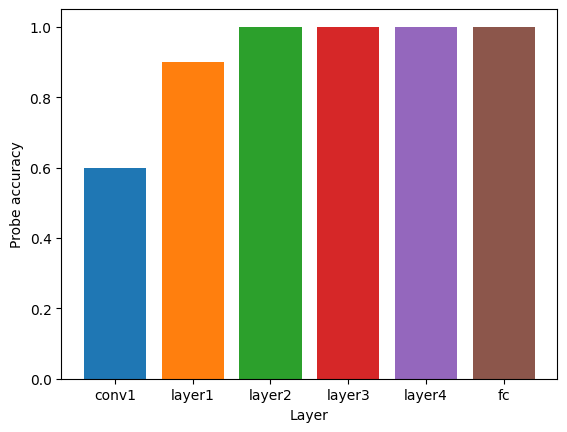

In [ ]:
colors = plt.cm.tab10(range(len(accuracies)))
plt.bar(range(len(accuracies)), accuracies, color=colors)
plt.xticks(range(len(probe_names)), probe_names)
plt.xlabel('Layer')
plt.ylabel('Probe accuracy')
plt.show()

Compare the stripes CAV to the activations in the corresponding layer, for the difficult image

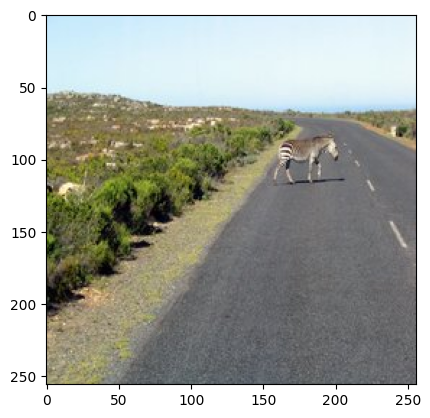

In [271]:
img = Image.open("/content/AIMS_XAI_Inga/data/imagenet/volcano_zebra.jpg").convert('RGB')
plt.imshow(img)
img_tensor = transform(img)

In [308]:
resnet.eval();
resnet(img_tensor.unsqueeze(0).to(device)).argmax()

tensor(980)

In [309]:
activations = {}
# keys = layer names (strings)
# values = activation tensors

def get_activation(name):
    def hook(model, input, output):
        activations[name] = output.detach()
    return hook

layer_name = 'layer4'
handle = dict(resnet.named_modules())[layer_name].register_forward_hook(get_activation(layer_name))

_ = resnet(img_tensor.unsqueeze(0).to(device))

handle.remove()
mystery_activations = activations["layer4"].flatten()

In [310]:
print("Activation vector shape:", mystery_activations.shape)
print("Stripes CAV shape:", stripes_cav.shape)

Activation vector shape: torch.Size([25088])
Stripes CAV shape: (25088,)


## Homework 3-2
For the misclassified mystery image, located in data/imagenet/volcano_zebra.jpg, let's use the stripes CAV to find out what went wrong.

In [277]:
from sklearn.metrics.pairwise import cosine_similarity

In [314]:
mystery_activations_all = []
for name in names:
  handle = dict(resnet.named_modules())[name].register_forward_hook(get_activation(name))
  _ = resnet(img_tensor.unsqueeze(0).to(device))
  mystery_activations = activations[name].flatten()
  mystery_activations_all.append(mystery_activations)

In [285]:
len(mystery_activations_all)

10

The cosine between mystery_activations and the concept Stripes is close of 0, which means that the activation is not aligned with the concept.
It points neither clearly toward the concept nor in the opposite direction.  That explain why wrong.

In [278]:
cosine_similarity(mystery_activations.reshape(1, -1), stripes_cav.reshape(1, -1))

array([[0.04867708]])

The cosine is closed of 0 so

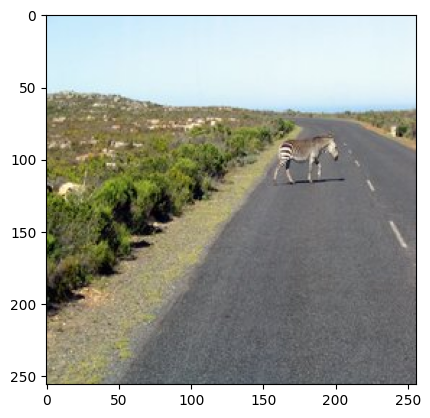

In [279]:
filepath = "/content/AIMS_XAI_Inga/data/imagenet/volcano_zebra.jpg"
img = read_image(filepath).float() / 255.0
look_at(img)

In [280]:
resnet.eval();
resnet(img.unsqueeze(0).to(device)).argmax()

tensor(977)

# Homework 4

## Transformers

In [ ]:
# @title
import torch
import math
import matplotlib.pyplot as plt

def tokenize_input(tokenizer, input_sentence):
    """Tokenize the input sentence."""

    tokenizer.truncation_side = "right"
    inputs = tokenizer(input_sentence, return_tensors="pt", truncation=True, padding=True) # Add a [CLS] token at the beginning and a [SEP] token at the end of the sentence
    return inputs

def get_model_pred(logits):
    """Return the model prediction."""

    probs = torch.softmax(logits, dim=-1)
    pred = torch.argmax(probs).item()
    return pred

def plot_attention_weights(attentions, tokens, layer=0):
    """Plot the attention weights for all heads in a given layer."""

    attention = attentions[layer][0].detach().cpu().numpy() # Select first batch element, shape (num_heads, seq_len, seq_len)
    n_heads = attention.shape[0]

    seq_len = len(tokens)

    # Determine subplot grid based on the number of heads
    cols = int(math.ceil(math.sqrt(n_heads)))
    rows = int(math.ceil(n_heads / cols))

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
    axes = axes.flatten()

    vmin, vmax = 0.0, 1.0 # Attention weights are softmax normalized

    for i in range(n_heads):
        ax = axes[i]

        # Plot attention heatmap
        im = ax.imshow(attention[i], vmin=vmin, vmax=vmax, cmap='viridis')

        ax.set_title(f"Head {i}", fontsize=10)

        # Set token labels on x and y axis
        ax.set_xticks(range(seq_len))
        ax.set_yticks(range(seq_len))
        ax.set_xticklabels(tokens, rotation=45, fontsize=8)
        ax.set_yticklabels(tokens, fontsize=8)

        ax.set_xlabel("Key", fontsize=9)
        ax.set_ylabel("Query", fontsize=9)

    # Hide any unused subplots
    for j in range(n_heads, len(axes)):
        axes[j].axis('off')

    # Shared colorbar
    fig.subplots_adjust(right=0.88)
    cbar_ax = fig.add_axes([0.91, 0.15, 0.02, 0.7])
    fig.colorbar(im, cax=cbar_ax)

    plt.suptitle(f"Attention heads at layer {layer}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 0.9, 0.95])
    plt.show()

In [ ]:
# @title
import os
import random
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import numpy as np
import torch
from sklearn.utils import shuffle
from sklearn.linear_model import LogisticRegression

torch.manual_seed(1337)
np.random.seed(1337)
random.seed(1337)

def select_concept_images(folder_path, concept, n):
    """
    Returns a list with up to `n` random .jpg fiel paths from `folder_path` that start with `concept`.
    """
    matching_files = [
        os.path.join(folder_path, f)
        for f in os.listdir(folder_path)
        if (f.lower().startswith(concept.lower()) and f.lower().endswith('.jpg'))
    ]

    # Shuffle and select
    if len(matching_files) < n:
        print(f"Only found {len(matching_files)} files matching concept '{concept}'. Returning all.")
        return matching_files
    else:
        return random.sample(matching_files, n)

def sample_images(folder_path, n):
    """
    Returns a list with up to `n` random files from `folder_path`.
    """
    files = [
        os.path.join(folder_path, f)
        for f in os.listdir(folder_path)
        if f.lower().endswith(('.jpg', '.jpeg'))
    ]

    # Shuffle and select
    if len(files) < n:
        print(f"Only found {len(files)} files in folder. Returning all.")
        return files
    else:
        return random.sample(files, n)

def get_vit_dataloader(image_paths, processor, batch_size=16):
    dataset = ViTImageDataset(image_paths, processor)
    loader = DataLoader(dataset, batch_size=batch_size)
    return loader

class ViTImageDataset(Dataset):
    def __init__(self, paths, processor=None):
        self.processor = processor
        self.image_paths = paths

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert("RGB")
        inputs = self.processor(images=image, return_tensors="pt")
        return inputs['pixel_values'].squeeze(0)

def make_activation_hook(activations):
    def fwd_hook(module, input, output):
        out = output[0]
        activations.append(out.squeeze(0).detach().cpu())
    return fwd_hook

def make_gradient_hook(grads):
    def bwd_hook(module, grad_input, grad_output):
        grad = grad_output[0]
        grads.append(grad.squeeze(0).detach().cpu())
    return bwd_hook

def get_activations(model, data_loader, device, layer):
    model.eval()
    all_activations = []

    for batch_inputs in data_loader:
        for i in range(batch_inputs.size(0)):

            sample_input = batch_inputs[i].unsqueeze(0).to(device)

            activations = []
            hook = layer.register_forward_hook(make_activation_hook(activations))

            with torch.no_grad():
                _ = model(sample_input)

            hook.remove()

            all_activations.append(activations[0])

    return torch.stack(all_activations)

def get_grads(model, data_loader, device, layer, target_idx=None):
    model.eval()
    all_grads = []

    for batch_inputs in data_loader:
        for i in range(batch_inputs.size(0)):
            sample_input = batch_inputs[i].unsqueeze(0).to(device)

            grads = []
            hook = layer.register_full_backward_hook(make_gradient_hook(grads))

            model.zero_grad()
            output = model(sample_input)

            logits = output.logits[0]

            if target_idx is None:
                logit = logits[logits.argmax()]
            else:
                logit = logits[target_idx]

            logit.backward()

            hook.remove()

            all_grads.append(grads[0])

    return torch.stack(all_grads)

def flatten(acts):
    return acts.view(acts.size(0), -1).numpy()



def train_cav(positive_activations, negative_activations, seed=1337):

    X = np.concatenate([positive_activations, negative_activations], axis=0)
    y = np.concatenate([np.ones(len(positive_activations)), np.zeros(len(negative_activations))])

    #X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, shuffle=True, random_state=seed)
    X_train, y_train = shuffle(X, y, random_state=seed)
    classifier = LogisticRegression(random_state=seed, max_iter=1000)
    classifier.fit(X_train, y_train)

    cav = classifier.coef_[0]
    unit_cav = cav / np.linalg.norm(cav)

    return unit_cav

def tcav(cav, grads):

    directional_derivatives = np.dot(grads, cav)
    positive_counts = np.sum(directional_derivatives > 0)
    tcav_score = positive_counts / directional_derivatives.shape[0]

    return tcav_score


In [ ]:
# pip install transformers
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from transformers import ViTImageProcessor, ViTForImageClassification
import torch
import torch.nn.functional as F
import shap

import os
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt

#from utils import tokenize_input, plot_attention_weights, get_model_pred
#from grad_sam import grad_sam
#from shap_values import shap_values
#from tcav import select_concept_images, sample_images, get_vit_dataloader, flatten, get_activations, get_grads, train_cav, tcav

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device {device}")

seed = 1337
torch.manual_seed(seed)
if torch.cuda.is_available():
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

Using device cpu


In [ ]:
# Use BERT trained on the SST-2 dataset (for binary classification)
tokenizer = AutoTokenizer.from_pretrained("textattack/bert-base-uncased-SST-2")
model = AutoModelForSequenceClassification.from_pretrained("textattack/bert-base-uncased-SST-2",attn_implementation="eager").to(device)
model.eval()

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/477 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/438M [00:00<?, ?B/s]

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12,

### Grad-SAM

In [356]:
def display_token_importance(tokens, importance):
    sorted_ = sorted(list(zip(tokens, importance)), key=lambda x: x[1], reverse=True)

    for i, (token, value) in enumerate(sorted_, start=1):
        print(f"{i}. '{token}': {value:.8f}")

def plot_token_importance(tokens, scores, title="Token importance (Grad-SAM)"):
    scores = scores - scores.min()
    if scores.max() > 0:
        scores = scores / scores.max()

    fig, ax = plt.subplots(figsize=(len(tokens) * 0.7, 2))

    ax.imshow(scores[np.newaxis, :], aspect="auto", cmap="Reds")
    ax.set_xticks(np.arange(len(tokens)))
    ax.set_xticklabels(tokens, rotation=45, ha="right")
    ax.set_yticks([])
    ax.set_title(title)

    plt.tight_layout()
    plt.show()


In [316]:

def get_grads_gradsam(model, attentions, logits):
    """Return the gradient of the output with respect to the attention weights for all heads in all layers."""

    n_layers = model.config.num_hidden_layers

    pred = get_model_pred(logits)
    logits = logits.squeeze()

    attention_grads = {layer_idx : None for layer_idx in range(n_layers)}

    # Retain gradients for attention matrices
    for att in attentions:
        att.retain_grad()

    model.zero_grad()

    # Backward from the model prediction
    logits[pred].backward(retain_graph=True)

    # Collect gradients for each layer
    for layer_idx, att in enumerate(attentions):
        grad = att.grad.squeeze().clone() # Shape (n_heads, seq_len, seq_len)
        attention_grads[layer_idx] = grad

    return attention_grads



In [325]:
def grad_sam(model, attentions, logits):
    """Returns the Grad-SAM score for all tokens in an input sequence."""

    model = model.to(device)

    n_heads = model.config.num_attention_heads  # number of attention heads
    n_layers = model.config.num_hidden_layers   # number of hidden layers

    # Get gradients of attention
    attention_grads = get_grads_gradsam(model, attentions, logits)

    seq_len = attentions[0].shape[-1]  # find sequence length from attentions, including CLS and SEP tokens are included

    layer_vectors = []

    for layer_idx, grad in attention_grads.items():

        relu_grad = torch.relu(grad)  # take the relu of the gradient # Shape (n_heads, seq_len, seq_len)
        attention = attentions[layer_idx].squeeze(0)  # get attentions for the layer # Shape (n_heads, seq_len, seq_len)

        hadamard_product = relu_grad * attention   # do the multiplication from the equation

        summed_columns = hadamard_product.sum(dim=2)  # Sum attention weights for each head (sum over columns) # Shape (n_heads, seq_len)

        summed_heads = summed_columns.sum(dim=0)  # Sum over all heads # Shape (seq_len)


        # Append to layer_vectors
        layer_vectors.append(summed_heads)

    # Sum over all layers
    grad_sam_scores = torch.stack(layer_vectors, dim=0).sum(dim=0)  # sum over the layer_vectors
    grad_sam_scores = grad_sam_scores - grad_sam_scores.min()
    if grad_sam_scores.max() > 0:
        grad_sam_scores = grad_sam_scores / grad_sam_scores.max()

    return grad_sam_scores


In [326]:
sentences = ["I like the movie",
            "She hates the book",
            "This is so boring",
            "I cannot wait for next time",
            "You look extremely confused"
            ]

for sentence in sentences:
    # Return the tokenizer output for the input sentence, which includes the tokenized sentences with
    # added CLS and SEP tokens and the attention masks
    input = tokenize_input(tokenizer, sentence).to(device)
    output = model(**input, output_attentions=True) # Forward pass
    logits = output.logits
    pred = get_model_pred(logits)

    # Get attention matrices for all heads and layers
    attentions = output.attentions
    # attentions is a tuple with tensor elements of shape
    # (batch size, num attention heads, sequence length, sequence length),
    # one tensor per layer (i.e., encoder block)
    print(f"The sentiment of '{sentence}' is {pred}")

The sentiment of 'I like the movie' is 1
The sentiment of 'She hates the book' is 0
The sentiment of 'This is so boring' is 0
The sentiment of 'I cannot wait for next time' is 1
The sentiment of 'You look extremely confused' is 0


In [327]:
grad_sam_scores = grad_sam(model, attentions, logits).detach().cpu().numpy()


In [328]:
tokens = tokenizer.convert_ids_to_tokens(input["input_ids"][0])
display_token_importance(tokens, grad_sam_scores)

1. '[CLS]': 1.00000000
2. 'confused': 0.77727139
3. 'you': 0.47701615
4. 'look': 0.44648346
5. 'extremely': 0.30431190
6. '[SEP]': 0.00000000


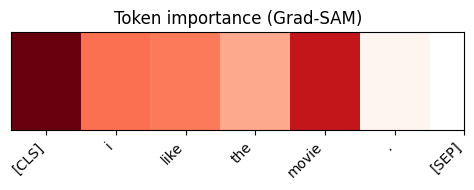

In [357]:
plot_token_importance(tokens, grad_sam_scores)

### SHAP

In [353]:
"""Implementation following https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/text.html"""

def f(x):
    # Tokenize all strings in input
    tv = torch.tensor([tokenizer(v, truncation=True,
                                 max_length=tokenizer.model_max_length,
                                 padding="max_length")["input_ids"] for v in x], device=device)

    # Fix padding stuff when input consist of several sentences
    attention_masks = torch.tensor([tokenizer(v, truncation=True, max_length=tokenizer.model_max_length,
                                              padding="max_length")["attention_mask"] for v in x], device=device)

    # Get model prediction (logits) and return the positive class
    outputs = model(input_ids=tv, attention_mask=attention_masks)[0].detach().cpu().numpy()

    return np.array(outputs[:,1]) # Positive class logits



Attention masks isn't necessary when the input is one sentence.

When the input contains several sentences of different lengst, padding tokens must be added.

Attention masks masks out padding tokens when calculating attention scores, so that only the actual input sentence is used.


In [330]:
f(sentences)

array([ 3.6635602, -3.145779 , -3.4217703,  2.665551 , -2.903021 ],
      dtype=float32)

In [331]:
explainer = shap.Explainer(f, tokenizer)
shap_values = explainer(sentences, fixed_context=1)

  0%|          | 0/30 [00:00<?, ?it/s]

PartitionExplainer explainer:  20%|██        | 1/5 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

PartitionExplainer explainer:  60%|██████    | 3/5 [00:55<00:32, 16.49s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

PartitionExplainer explainer:  80%|████████  | 4/5 [01:24<00:21, 21.80s/it]

  0%|          | 0/56 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████| 5/5 [02:11<00:00, 31.12s/it]

  0%|          | 0/30 [00:00<?, ?it/s]

PartitionExplainer explainer: 6it [02:37, 31.48s/it]


In [335]:
shap_values

.values =
array([array([-0.12959369,  0.5697345 ,  2.80113624, -0.14384766,  0.32744562,
               0.17642224])                                                   ,
       array([ 0.04401791,  0.04553521, -3.53780533, -0.05805473,  0.00513335,
               0.29313202])                                                   ,
       array([ 0.30843858,  0.25726203,  0.28962771,  0.28991643, -4.94576707,
               0.31648932])                                                   ,
       array([-0.10001777,  0.30019118,  1.070114  ,  1.28322409,  0.11099617,
               0.42984835,  0.22122888, -0.22297736])                         ,
       array([ 0.59630467,  0.48589803,  0.2785715 , -0.05426274, -4.83737086,
               0.56557562])                                                   ],
      dtype=object)

.base_values =
array([ 0.06226267,  0.06226267,  0.06226267, -0.42705658,  0.06226267])

.data =
(array(['', 'I ', 'like ', 'the ', 'movie', ''], dtype=object), array(['', '

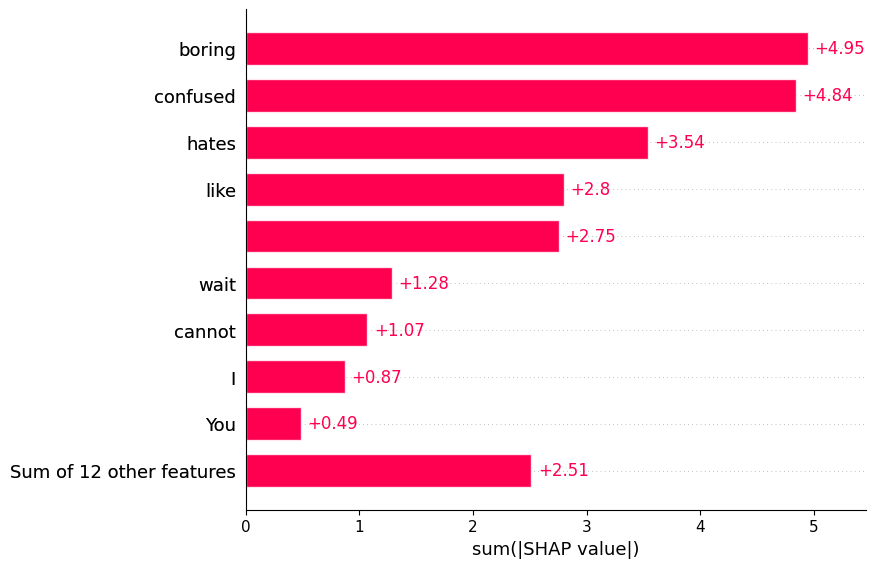

In [333]:
shap.plots.bar(shap_values.abs.sum(0))

In [ ]:
i = 3
shap.plots.initjs()
shap.plots.text(shap_values[i])

In [350]:
i = 4
shap.plots.initjs()
shap.plots.text(shap_values[i])

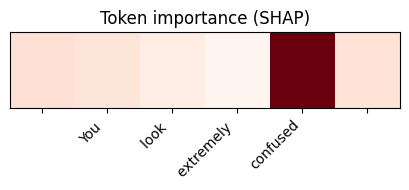

In [351]:
plot_token_importance(shap_values[i].data, np.abs(shap_values[i].values), title="Token importance (SHAP)")


 #### Comment

 Why [CLS] got high value for GRAD-SAM and not SHAP.
 This difference can be explain by  the distinct ways SHAP and GRAD-SAM measure feature importance:
In fact Grad-SAM computes importance based on thegradients of attention scores. Since BERT aggregates information from all input tokens into the [CLS] token for classification, Grad-SAM detects this concentration of information and assigns the [CLS] token the highest importance.


In another hand SHAP measures importance by evaluating the change in the model's output when a token is **masked or removed**. In BERT, the [CLS] token itself does not carry unique input information it only aggregates what other tokens provide. Therefore, removing or masking [CLS] does not change the model's prediction in the way SHAP measures importance, leading SHAP to assign it near-zero importance.

**TCAV score**

In [ ]:
processor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224')
vit = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224').to(device)
vit.eval()


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_features=3072, bias=True)
            (intermed

In [ ]:
label2id = vit.config.label2id
class_idx = label2id.get(target_class)

positive_loader = get_vit_dataloader(p_concept_paths, processor, batch_size=batch_size)
negative_loader = get_vit_dataloader(n_concept_paths, processor, batch_size=batch_size)
target_loader = get_vit_dataloader(target_paths, processor, batch_size=batch_size)

layer = vit.vit.encoder.layer[10]

positive_activations = flatten(get_activations(vit, positive_loader, device, layer))
negative_activations = flatten(get_activations(vit, negative_loader, device, layer))

cav = train_cav(positive_activations, negative_activations)

grads = flatten(get_grads(vit, target_loader, device, layer, target_idx=class_idx))
tcav_score = tcav(cav, grads)
print(f"TCAV score: {tcav_score}")



TCAV score: 1.0


In [354]:
sentence = "I like the movie."

# Re-initialize tokenizer and model for BERT to ensure correctness
tokenizer = AutoTokenizer.from_pretrained("textattack/bert-base-uncased-SST-2")
model = AutoModelForSequenceClassification.from_pretrained("textattack/bert-base-uncased-SST-2",attn_implementation="eager").to(device)
model.eval()

input = tokenize_input(tokenizer, sentence).to(device)
output = model(**input, output_attentions=True)
logits = output.logits

# Get attention matrices for all heads and layers
attentions = output.attentions # Tuple with tensor elements of shape (batch size, num attention heads, sequence length, sequence length), one tensor per layer (i.e., encoder block)

tokens = tokenizer.convert_ids_to_tokens(input["input_ids"][0])

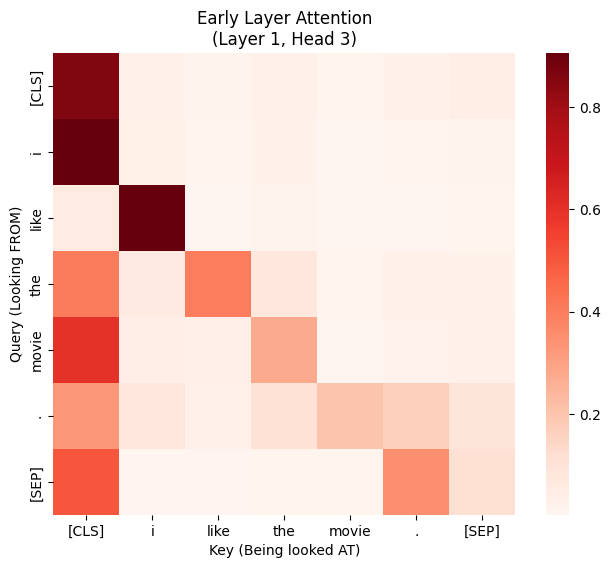

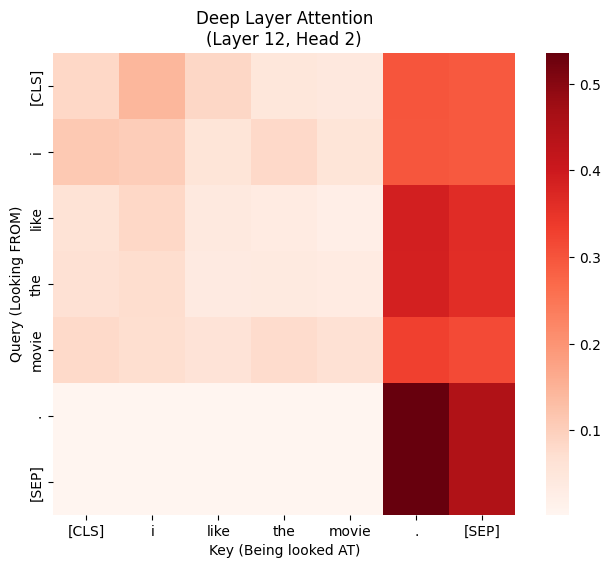

In [358]:
import seaborn as sns

def my_plot_for_head(attentions, layer_idx, head_idx, tokens, title):
    layer_attentions = attentions[layer_idx]
    head_attention = layer_attentions[0, head_idx, :, :].detach().cpu().numpy()

    # 3. Plot
    plt.figure(figsize=(8, 6))
    sns.heatmap(head_attention, xticklabels=tokens, yticklabels=tokens, cmap="Reds", square=True)
    plt.title(f"{title}\n(Layer {layer_idx + 1}, Head {head_idx + 1})")
    plt.xlabel("Key (Being looked AT)")
    plt.ylabel("Query (Looking FROM)")
    plt.show()

# Layer 1 and head 3
layer_early = 0
head_early = 2

# Layer 12 and head 2
layer_deep = 11
head_deep = 1

my_plot_for_head(attentions, layer_early, head_early, tokens, title="Early Layer Attention")
my_plot_for_head(attentions, layer_deep, head_deep, tokens, title="Deep Layer Attention")

#### comment
* Layer 1, Head 3 shows local syntactic attention.  THis plot shows a high attention between I and like, there are also between the token [CLS] AND "i".

* Layer 12, Head 2 shows a attention on vertical direction pattern that focuses on separator tokens like "." and [SEP]. Even though [CLS] is the token used for classification, also  deep layers often pay attention to [SEP] or punctuation as "attention sinks." This means this head has mostly finished processing the sentence and is now focusing on neutral tokens, ignoring words that are not important for its role.


# Homework 5

## CNN

In [338]:
import os

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F
from PIL import Image, ImageOps
from scipy.ndimage import gaussian_filter
from torchvision import models, transforms

### Setup model, transforms, and example image

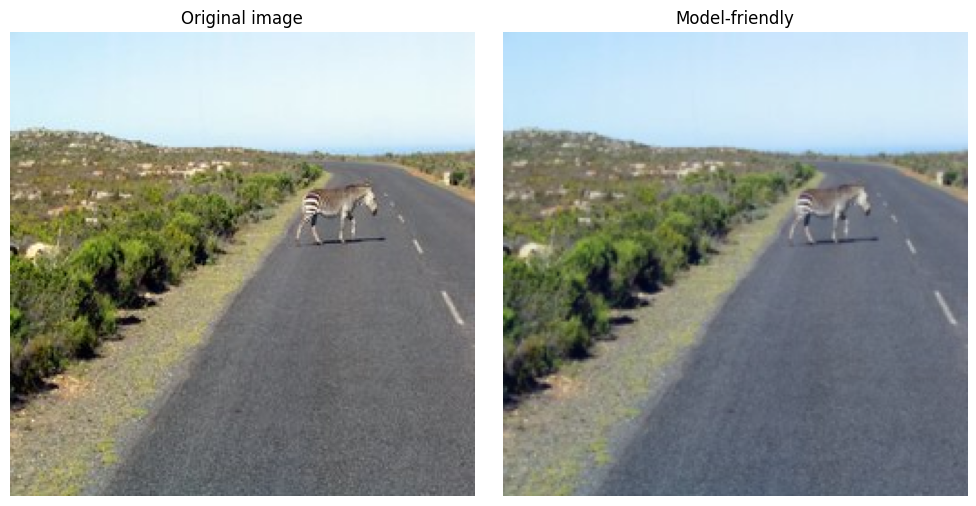

In [339]:
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
model.to(device)
model.eval()

# Load your image here
image_path = "/content/AIMS_XAI_Inga/data/imagenet/volcano_zebra.jpg"
image = Image.open(image_path)
image = ImageOps.exif_transpose(image) # Potentially flip image if it was taken in portrait mode

transform_human = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# For model input: resize, divides by 255, then normalize with ImageNet statistics
transform_model = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
image_human = transform_human(image)
image_model = transform_model(image)

# Min-max normalize to [0,1]. Do not give this to the model! Just for plotting
image_model_normalized = (image_model - image_model.min()) / (image_model.max() - image_model.min())

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image)
axs[0].axis("off")
axs[0].set_title("Original image")
axs[1].imshow(image_model_normalized.permute(1, 2, 0))
axs[1].axis("off")
axs[1].set_title("Model-friendly")
plt.tight_layout()
plt.show()

In [340]:
input_image = image_model.unsqueeze(0).to(device)
input_image.requires_grad = True

# Forward pass
output = model(input_image) # logits
pred_class = output.argmax(dim=1) # predicted class
score = output[0, pred_class] # largest logit

# Just for fun: whats the probability of the predicted class?
# Class indices https://deeplearning.cms.waikato.ac.nz/user-guide/class-maps/IMAGENET/
print(f"Probability of predicted class: {F.softmax(output, dim=1)[0, pred_class].item():.2%}")
print(f"Predicted class index: {pred_class.item()}") # 340 is zebra. Good job little AI

# Backward pass
model.zero_grad()
score.backward()

# Get gradient wrt. the input image
gradient = input_image.grad.squeeze()
print(f"Image shape: {input_image.shape}")
print(f"Gradient shape: {gradient.shape}")

Probability of predicted class: 8.96%
Predicted class index: 980
Image shape: torch.Size([1, 3, 224, 224])
Gradient shape: torch.Size([3, 224, 224])


### Color importance is rarely intuitive

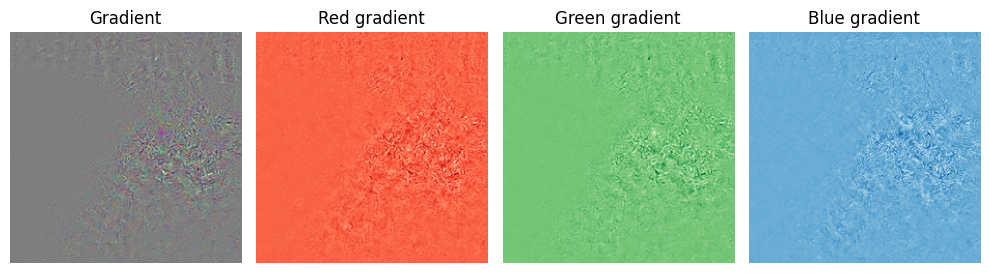

In [341]:
# Plot the gradient with RGB, and each channel in a different color
fig, axs = plt.subplots(1, 4, figsize=(10, 5))
gradient = gradient.cpu().permute(1, 2, 0)
gradient = (gradient - gradient.min()) / (gradient.max() - gradient.min())
axs[0].imshow(gradient)
axs[0].axis("off")
axs[0].set_title("Gradient")

Colors = {"Red": "Reds", "Green": "Greens", "Blue": "Blues"}
for i, channel in enumerate(("Red", "Green", "Blue")):
    axs[i+1].imshow(gradient[:,:,i].cpu().detach().numpy(), cmap=Colors[channel])
    axs[i+1].axis("off")
    axs[i+1].set_title(f"{channel} gradient")
plt.tight_layout()
plt.show()

# Aggregate channels into a single value and clamp

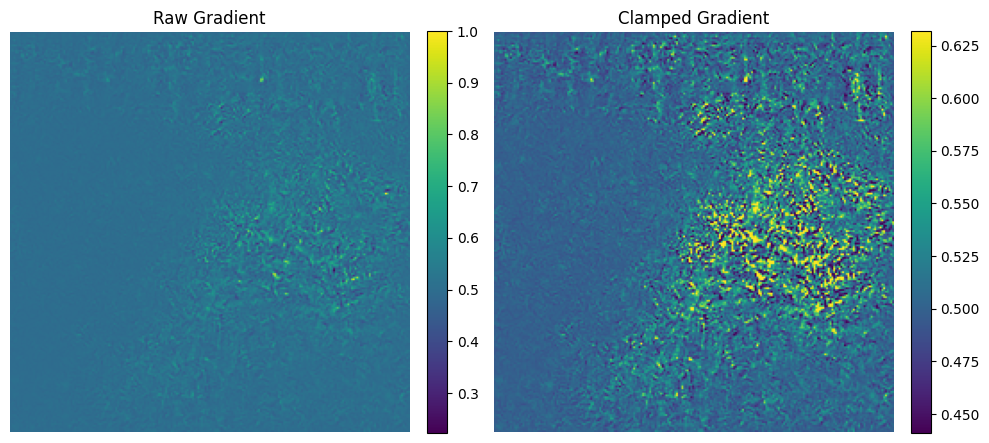

In [342]:
def aggregate_channels(channel_attributions, clamp=True):
    # Multiple options:
    aggregated = channel_attributions.abs().max(dim=-1).values
    #aggregated = channel_attributions.abs().sum(dim=-1)
    #aggregated = channel_attributions.sum(dim=-1).abs()

    # Improves visual nuances
    if clamp:
        return torch.clamp(aggregated, torch.quantile(aggregated.flatten(), 0.01), torch.quantile(aggregated.flatten(), 0.99))
    return aggregated

gradient_aggregated = aggregate_channels(gradient, clamp=False)
gradient_aggregated_clamped = aggregate_channels(gradient, clamp=True)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))
im0 = axs[0].imshow(gradient_aggregated)
axs[0].axis("off")
axs[0].set_title("Raw Gradient")
fig.colorbar(im0, ax=axs[0], fraction=0.046, pad=0.04)

im1 = axs[1].imshow(gradient_aggregated_clamped)
axs[1].axis("off")
axs[1].set_title("Clamped Gradient")
fig.colorbar(im1, ax=axs[1], fraction=0.046, pad=0.04)
plt.tight_layout()
plt.show()

# Gaussian smoothing and overlay

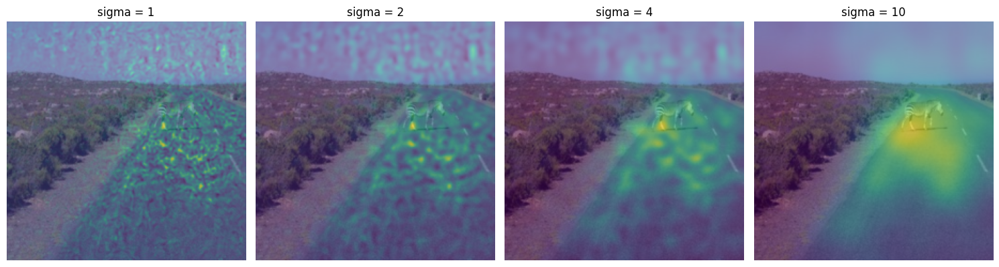

In [343]:
sigmas = (1, 2, 4, 10)
fig, axs = plt.subplots(1, len(sigmas), figsize=(15, 5))
for i, sigma in enumerate(sigmas):
    # Apply gaussian smoothing
    gradient_smoothed = gaussian_filter(gradient_aggregated_clamped, sigma=sigma)

    axs[i].imshow(image_human.permute(1, 2, 0))
    axs[i].imshow(gradient_smoothed, alpha=0.6)
    axs[i].set_title(f"sigma = {sigma}")
    axs[i].axis("off")
plt.tight_layout()
plt.show()


torch.Size([1, 3, 224, 224]) torch.Size([1, 3, 224, 224])
torch.Size([224, 224, 3])
torch.Size([224, 224])


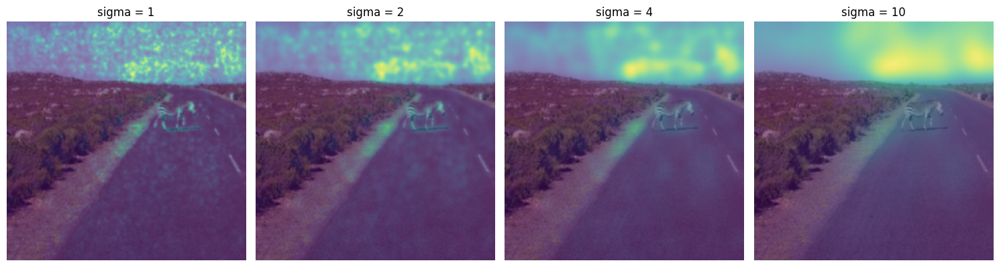

In [344]:
# Recompute the gradient
model.zero_grad(set_to_none=True)
logits = model(input_image)
score = logits[0, pred_class]
score.backward()
gradient = input_image.grad

print(gradient.shape, input_image.shape)
gradient_times_input = gradient * input_image
gradient_times_input = gradient_times_input.squeeze(0).permute(1, 2, 0).detach().cpu()
print(gradient_times_input.shape)
gradient_times_input = aggregate_channels(gradient_times_input)
print(gradient_times_input.shape)

sigmas = (1, 2, 4, 10)
fig, axs = plt.subplots(1, len(sigmas), figsize=(15, 5))
for i, sigma in enumerate(sigmas):
    # Apply gaussian smoothing
    gradient_smoothed = gaussian_filter(gradient_times_input, sigma=sigma)
    gradient_smoothed = (gradient_smoothed / gradient_smoothed.max())

    axs[i].imshow(image_human.permute(1, 2, 0))
    axs[i].imshow(gradient_smoothed, alpha=0.6)
    axs[i].set_title(f"sigma = {sigma}")
    axs[i].axis("off")
plt.tight_layout()
plt.show()


### The sky looks important? Or maybe an artifact of the image having large values in this region?



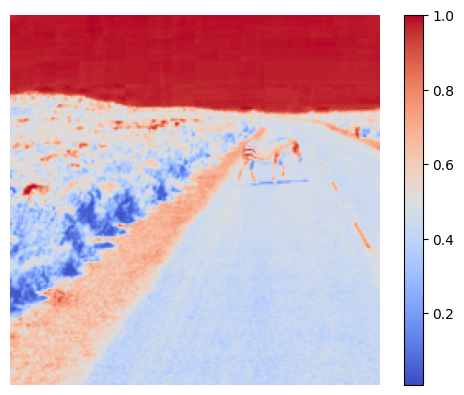

In [345]:
# Plot the absolute max value of the original image
plt.imshow(image_human.permute(1, 2, 0).abs().max(dim=-1).values, cmap="coolwarm")
plt.axis("off")
plt.colorbar()
plt.show()


**Class Activation Maps (CAM)**

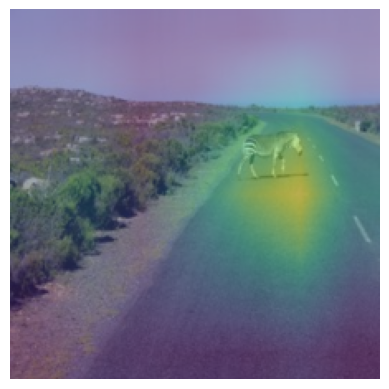

In [346]:
activations = []
def forward_hook(module, inp, out):
    activations.append(out.detach())

# Make sure this is the last conv layer!
handle = model.layer4[1].conv2.register_forward_hook(forward_hook)
with torch.no_grad():
    _ = model(input_image)
handle.remove()
acts = activations[0] # [1, C, H, W]

weights = model.fc.weight[pred_class].view(1, -1, 1, 1)  # [1, C, 1, 1]
cam = torch.sum(torch.relu(weights * acts), dim=1, keepdim=False).squeeze(0) # [H, W]

# Interpolate to original image size
target_size = input_image.shape[-2:]
cam = torch.nn.functional.interpolate(
    cam.unsqueeze(0).unsqueeze(0),
    size=target_size,
    mode="bilinear",
    align_corners=False,
)[0, 0]

plt.imshow(image_human.permute(1, 2, 0))
plt.imshow(cam.cpu().detach().numpy(), alpha=0.5)
plt.axis("off")
plt.show()

### Grad-CAM

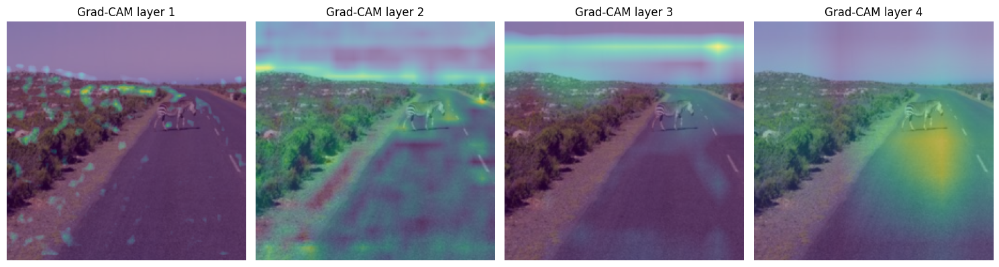

In [347]:
layers = [
    model.layer1[1].conv2,
    model.layer2[1].conv2,
    model.layer3[1].conv2,
    model.layer4[1].conv2,
]

# Storage
layer_activations = {}
layer_gradients = {}
# We save both activations and gradients for each conv layer
def forward_hook(module, inp, out):
    layer_activations[module] = out.detach()

    def backward_hook(grad):
        layer_gradients[module] = grad.detach()

    out.register_hook(backward_hook)

# Register hooks
handles = [layer.register_forward_hook(forward_hook) for layer in layers]

# Forward + backward
model.zero_grad(set_to_none=True)
output = model(input_image)
score = output[0, pred_class]
score.backward()

# Remove forward hooks. Backward hooks are automatically removed
for h in handles:
    h.remove()

# Compute and visualize Grad-CAM for each layer
fig, axs = plt.subplots(1, len(layers), figsize=(15, 15))
for i, layer in enumerate(layers):
    acts = layer_activations[layer] # [1, C, H, W]
    grads = layer_gradients[layer] # [1, C, H, W]
    weights = grads.mean(dim=(2, 3), keepdim=True) # [1, C, 1, 1]

    # Weighted sum of activations
    grad_cam = (weights * acts).sum(dim=1) # [1, H, W]

    # Interpolate to original image size
    grad_cam = torch.nn.functional.interpolate(
        grad_cam.unsqueeze(0),
        size=input_image.shape[-2:],
        mode="bilinear",
        align_corners=False,
    )[0, 0]

    grad_cam = grad_cam.relu().cpu().detach().numpy()

    axs[i].imshow(image_human.permute(1, 2, 0))
    axs[i].imshow(grad_cam, alpha=0.5)
    axs[i].set_title(f"Grad-CAM layer {i+1}")
    axs[i].axis("off")
plt.tight_layout()
plt.show()


**Integrated Gradients**

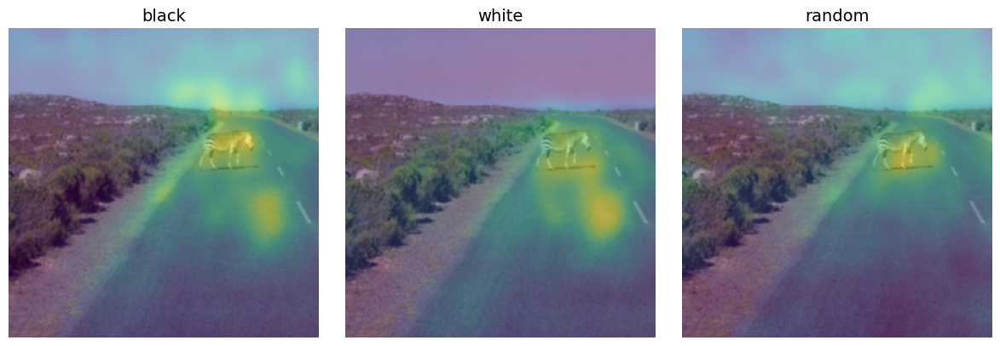

In [348]:
normalize = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

# Baselines
baselines = {
    "black":  torch.zeros(1, 3, input_image.shape[-2], input_image.shape[-1], device=device),
    "white":  torch.ones(1, 3, input_image.shape[-2], input_image.shape[-1], device=device),
    "random": torch.rand(1, 3, input_image.shape[-2], input_image.shape[-1], device=device),
}

# Normalize baselines to match input_image
for bname, b in baselines.items():
    baselines[bname] = normalize(b.squeeze(0)).unsqueeze(0)

steps = 100
fig, axes = plt.subplots(1, len(baselines), figsize=(12, 4))

for ax, (bname, baseline) in zip(axes, baselines.items()):
    # Path scaling
    scaled_inputs = []
    for alpha in torch.linspace(0.0, 1.0, steps, device=device):
        scaled = baseline + alpha * (input_image - baseline)
        scaled_inputs.append(scaled)

    # Accumulate gradients
    grads_accum = torch.zeros_like(input_image, device=device)
    for scaled in scaled_inputs:
        scaled = scaled.clone().detach().requires_grad_(True)
        model.zero_grad(set_to_none=True)

        logits = model(scaled)
        score = logits[0, pred_class]
        score.backward()

        grads_accum += scaled.grad.detach()

    avg_grads = grads_accum / float(steps)
    ig = (input_image - baseline) * avg_grads

    # Plotting
    ig_map = aggregate_channels(ig.squeeze(0).permute(1, 2, 0).cpu().detach())
    ig_map = gaussian_filter(ig_map, sigma=6)

    ax.imshow(image_human.permute(1, 2, 0))
    ax.imshow(ig_map, alpha=0.5)
    ax.set_title(f"{bname}", fontsize=14)
    ax.axis("off")

plt.tight_layout()
plt.show()

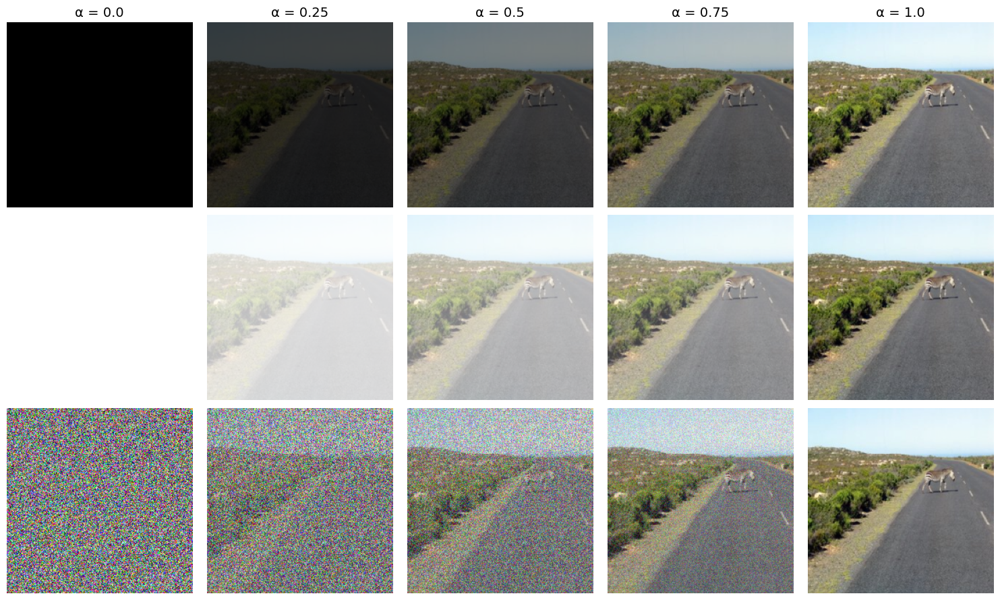

In [349]:
# Unnormalize for plotting
def unnormalize(t):
    mean = torch.tensor([0.485, 0.456, 0.406], device=t.device).view(3,1,1)
    std  = torch.tensor([0.229, 0.224, 0.225], device=t.device).view(3,1,1)
    return t * std + mean

alphas = [0.0, 0.25, 0.5, 0.75, 1.0]

fig, axes = plt.subplots(len(baselines), len(alphas), figsize=(3*len(alphas), 3*len(baselines)))
for row_idx, (bname, baseline) in enumerate(baselines.items()):
    for col_idx, alpha in enumerate(alphas):

        # interpolation in normalized space
        interp = baseline + alpha * (input_image - baseline)

        # convert to RGB for display
        img = unnormalize(interp.squeeze(0)).permute(1, 2, 0).cpu().clamp(0, 1)

        ax = axes[row_idx, col_idx]
        ax.imshow(img.detach().numpy())
        ax.axis("off")

        # column labels (top row only)
        if row_idx == 0:
            ax.set_title(f"α = {alpha}", fontsize=14)

plt.tight_layout()
plt.show()

### Last question

|  post-hoc| **Model-Specific** | **Model-Agnostic** |
| --- | --- | --- |
| **Local** |  Gradient  Input,CAM,Grad-CAM,Integrated Gradients |   |
| **Global** | --- | --- |